In [4]:
import tensorflow as tf
import numpy as np
import gpflow as gp

jitter = 1e-6

def iteration(Xt, X, Yt, St, kern, mean, mut1, Ct1):
    """Perform one iteration of RGP.
    Args:
    :param Xt: Tensor (N, ndim) the coordinates of new data.
    :param X: Tensor (S, ndim) the coordinates of sparse basis.
    :param Yt: Tensor (D, N) the new data.
    :param St: Tensor (D, N) the data variance.
    :param kern: gp.kernels.Kernel the covariance of GP
        Signature: (N, ndim) -> (D, N, N)
    :param mut1: Tensor (S, D) last time step mean
    :param Ct1: Tensor (D, S, S) last time step covariance
    :param mean: callable the mean of GP, 
        Signature: (N, ndim) -> (D, N)
    """
    #D, N, N
    Ktt = kern.K(Xt,full_output_cov=False)
    #D, S, N
    Kxt = kern.K(X, Xt,full_output_cov=False)
    #D, S, S
    Kxx = kern.K(X,full_output_cov=False)
    #D, S, S
    L = tf.cholesky(Kxx + jitter*tf.eye(tf.shape(X)[0], dtype=tf.float64))

    # half Jt = L \ Kxt
    # D, S, N
    _Jt = tf.linalg.triangular_solve(L, Kxt)
    # Jt = (L^T \ (L \ Kxt))^T
    #D, S, N
    JtT = tf.linalg.triangular_solve(L,_Jt,adjoint=True)
    #D, S
    mu = mean(X)
    #D, S, 1
    dmu = (mut1 - mu)[:,:,None]
    #D, N, 1
    mutp = tf.matmul(JtT, dmu, transpose_a=True) + mean(Xt)[:,:,None]
    # B = Ktt - Ktx Kxx_inv Kxt
    #D, N, N
    B = Ktt - tf.matmul(_Jt,_Jt,transpose_a = True)
    # Cpt = B + Jt Ct1 Jt^t
    #D, S, S
    L_Ct1 = tf.cholesky(Ct1)
    #D, S, N
    _Ctp = tf.matmul(L_Ct1, JtT, transpose_a = True)
    #D, N, N
    Ctp = B + tf.matmul(_Ctp,_Ctp,transpose_a=True)
    # Gt = Ct1 Jt^T (Cpt + St)^{-1}
    #D, S, N
    _Gt = tf.matmul(L_Ct1, _Ctp)
    #D, N, N
    Cpts = Ctp + tf.matrix_diag(St)
    #D, N, N
    L_Cpts = tf.cholesky(Cpts + jitter*tf.eye(tf.shape(Xt)[0], dtype=tf.float64))
    #D, N, 1
    dy = Yt[:,:,None] - mutp
    #D, S, N
    Ct1JtT = tf.matmul(Ct1,JtT)
    #D, N
    mut = mut1 + tf.matmul(Ct1JtT,
            tf.linalg.triangular_solve(L_Cpts,
                tf.linalg.triangular_solve(L_Cpts, dy), 
                adjoint=True))[:,:,0]
    #D, N, S
    _Ct = tf.linalg.triangular_solve(L_Cpts, tf.transpose(Ct1JtT, (0,2,1)))
    #D, S, S
    Ct = Ct1 - tf.matmul(_Ct,_Ct,transpose_a=True)
    
    return mut, Ct
    

def test_iteration(output_folder='./test_online_rgp_figs_4'):
    import os
    os.makedirs(output_folder,exist_ok=True)
    X = np.sort(np.random.uniform(-10,10,size=1000))[:,None]
    Y = X/2. + 25*X/(1+X**2) * np.cos(X) + 1*np.random.normal(size=X.shape) + np.where(X>2.5,5.,0.)
    Yt = Y.T
    import pylab as plt
    plt.style.use('ggplot')


    S=20
    X_b = np.linspace(-10,10,S)[:,None]
    N=100

    with tf.Session(graph=tf.Graph()) as sess:
        X_pl = tf.placeholder(tf.float64)
        Yt_pl = tf.placeholder(tf.float64)
        Xt_pl = tf.placeholder(tf.float64)
        St_pl = tf.placeholder(tf.float64)
        kern = gp.multioutput.SharedIndependentMok(gp.kernels.RBF(1),1)
        kern.kern.variance = np.var(Y)
        kern.kern.lengthscales = 0.71
#         m = gp.models.GPR(X,Y,gp.kernels.RBF(1))
#         gp.train.ScipyOptimizer().minimize(m)
#         print(m)
        mean = lambda X: tf.transpose(X)*0.
        mut1_pl = tf.placeholder(tf.float64)
        Ct1_pl = tf.placeholder(tf.float64)

        mu0 = mean(X_pl)
        C0 = kern.K(X_pl,full_output_cov=False)

        mu, C = iteration(Xt_pl, X_pl, Yt_pl, St_pl, kern, mean, mut1_pl, Ct1_pl)
        ###
        #
        
        
        
        
        mut1, Ct1 = sess.run([mu0,C0],{X_pl:X_b})
        mus = []
        Cs = []
        
        for i in range(1000):
            feed_dict = {Xt_pl:X[i:i+1,:], X_pl:X_b, Yt_pl:Yt[:,i:i+1], St_pl:1*np.ones_like(Yt[:,i:i+1]),
                    mut1_pl:mut1, Ct1_pl:Ct1}
            mut1, Ct1 = sess.run([mu,C],feed_dict)
            Cs.append(np.diag(Ct1[0,:,:]))
            mus.append(mut1[0,:])
#             print(mut1)
            
            plt.scatter(X,Y,alpha=0.1)
            plt.scatter(X_b,mut1.T,c=plt.cm.terrain(i/1000))
            plt.errorbar(X_b[:,0],mut1[0,:],yerr=np.sqrt(Cs[-1]))
            plt.vlines(X[i,0],-10,10)
            plt.savefig(os.path.join(output_folder,"fig{:04d}.png".format(i)))
            plt.close('all')
        plt.plot(mus)
        plt.show()
        plt.plot(Cs)
        plt.yscale('log')
        plt.show()


# if __name__ == '__main__':
#     test_iteration()

In [5]:
from bayes_tec.datapack import DataPack
from bayes_tec.utils.data_utils import make_coord_array, calculate_weights
from timeit import default_timer
import pylab as plt
plt.style.use('ggplot')

In [433]:
with DataPack('../../scripts/data/killms_datapack_4.hdf5',readonly=True) as datapack:
    datapack.select(ant=None,freq=slice(0,48,1),time=slice(0,None,1),pol=slice(0,1,1))
    datapack.switch_solset('sol000')
    phase, axes = datapack.phase
    _, Nd, Na, Nf, Nt = phase.shape
    amp, axes = datapack.amplitude
    patch_names, directions = datapack.get_sources(axes['dir'])
    _, times = datapack.get_times(axes['time'])
    _, freqs = datapack.get_freqs(axes['freq'])
    antenna_labels, antennas = datapack.get_antennas(axes['ant'])
gains = amp * np.exp(1j*phase)

ERROR:root:Reference possible only for phase, scalarphase, clock, tec, tec3rd, and rotation solution tables. Ignore referencing.


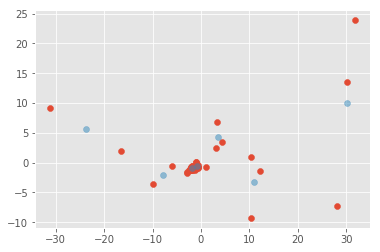

In [435]:
from scipy.cluster.vq import kmeans2
from bayes_tec.frames import ENU

def basis_antennas(X_a, N=5):
    if N <= X_a.shape[0]:
        C_a, idx = kmeans2(X_a,N, iter=10000,minit='points')
        return C_a
    C_a, idx = kmeans2(X_a,N, iter=10000,minit='random')
    return C_a

antennas_enu = antennas.transform_to(ENU(obstime=times[0],location=datapack.array_center))
X_a = np.array([antennas_enu.east.value,
                antennas_enu.north.value]).T/1000.

C_a = basis_antennas(X_a, N=min(7, X_a.shape[0]))


plt.scatter(X_a[:,0],X_a[:,1])
plt.scatter(C_a[:,0],C_a[:,1],alpha=0.5)
plt.show()

/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/scipy/cluster/vq.py:525: UserWarning: One of the clusters is empty. Re-run kmeans with a different initialization.
  warnings.warn("One of the clusters is empty. "
/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


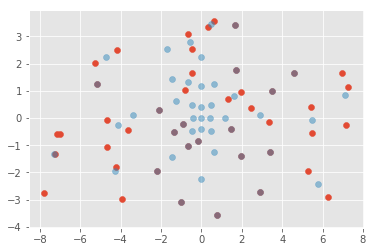

In [49]:
from scipy.cluster.vq import kmeans2
from bayes_tec.frames import ENU

def basis_directions(X_d, f_min=0.5, f_max=0.75, fov=5., N=7, dialate=False):
    l = np.linspace(-fov/2.,fov/2,N)
    dirs = np.meshgrid(l, l,indexing='ij')
    
    if dialate:
        dl = l[1] - l[0]
        #f_max = dl * (a + b * |fov|/2)
        #f_min = dl * (a)
        a = f_min / dl
        b = (f_max / dl - a)* 2. / fov


        R = np.sqrt(dirs[0]**2 + dirs[1]**2)
        dialate = a + b * R
        dirs[0] *= dialate
        dirs[1] *= dialate
    
    dirs = np.stack([dirs[0].flatten(), dirs[1].flatten()], axis=1)
    C_d, idx = kmeans2(X_d,dirs, iter=10000,minit='matrix')
    
    return C_d

X_d = np.array([directions.ra.deg-directions.ra.deg.mean(),
                directions.dec.deg - directions.dec.deg.mean()]).T
C_d = basis_directions(X_d, f_min=0.25, f_max=0.75, fov=5., N=7, dialate=True)


plt.scatter(X_d[:,0],X_d[:,1])
plt.scatter(C_d[:,0],C_d[:,1],alpha=0.5)
plt.show()

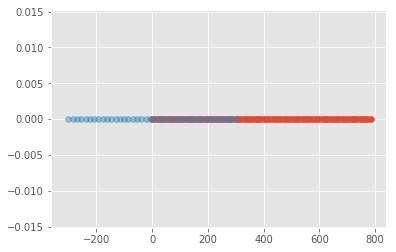

In [104]:
def basis_time(t, dt=15., N=40):
    return np.linspace(t - dt*N/2., t + dt*N/2., N)[:,None]

C_t = basis_time(0,dt=15,N=40)
plt.scatter(times.mjd[1:100]*86400. - times[1].mjd*86400., times.mjd[1:100]*0.)
plt.scatter(C_t, C_t*0.,alpha=0.5)
plt.show()

In [426]:
def gains_mean( freq, mean_amp=1., sigma_tec=0.01):
    """Returns mean of real and imaginary pary"""
    mean_real = mean_amp * np.exp(-0.5*(8.448e9*sigma_tec/freq)**2 )
    mean_imag = np.zeros_like(freq)
    return mean_real, mean_imag

from scipy.linalg import solve_triangular

def transform_gains(freqs, mean_amp=1., sigma_tec=0.01):
    
    # cross correlation real x imag is zero
    Nf = np.size(freqs)
    
    A = (-8.448e9*sigma_tec/freqs)
    mean_real = mean_amp * np.exp(-0.5*A**2 )
    mean_imag = np.zeros_like(freqs)
    
    B = (-8.448e9*sigma_tec/(freqs[:,None]*freqs[None,:]))
    
    real_cov_freq = mean_amp**2 * 0.5 * np.prod([
        np.exp(-0.5*B**2 * (freqs[:,None] + freqs[None,:])**2),
        (-1. + np.exp(B**2*(freqs[:,None]*freqs[None,:])))**2], axis=0)
    
    plt.imshow(real_cov_freq)
    plt.colorbar()
    plt.show()
    L_real = np.linalg.cholesky(real_cov_freq + 1e-10*np.eye(Nf))
    
    r = np.dot(L_real,np.random.normal(size=(Nf,500)))
    plt.plot(freqs,r,alpha=0.1,c='black')
    plt.show()
    
    imag_cov_freq = mean_amp**2 * 0.5 * np.sum([
        np.exp(-0.5 * B**2 * (freqs[:,None] - freqs[None,:])**2),
        - np.exp(-0.5 * B**2 * (freqs[:,None] + freqs[None,:])**2)],axis=0)
    
    plt.imshow(imag_cov_freq)
    plt.show()
    L_imag = np.linalg.cholesky(imag_cov_freq  + 1e-10*np.eye(Nf))
    
    r = np.dot(L_imag,np.random.normal(size=(Nf,500)))
    plt.plot(freqs,r,alpha=0.1,c='black')
    plt.show()
    
    def whiten(g):
        """
        :param g: array (Nt, Nd, Na, Nf)
        Returns whitened wrt frequency
        """
        gr = g.real - mean_real
        gi = g.imag - mean_imag
        shape = gr.shape
        
#         gr = np.linalg.solve(L_real, gr[...,None])
#         gi = np.linalg.solve(L_imag, gi[...,None])
        
        gr = solve_triangular(L_real,gr.reshape((-1,Nf)).T, lower=True).T.reshape(shape)
        gi = solve_triangular(L_imag,gi.reshape((-1,Nf)).T, lower=True).T.reshape(shape)
        
        return gr + 1j*gi
            
    return whiten

real_mean, imag_mean = gains_mean(freqs, mean_amp=1., sigma_tec=0.01)

#Nd, Na, Nf, Nt
gi = gains.imag[0,:,:,:,:] - imag_mean[:, None]
#Nd, Na, Nf, Nt
gr = gains.real[0,:,:,:,:] - real_mean[:, None]
#2, Nd, Na, Nf, Nt
Y = np.concatenate([gr[None, ...], gi[None, ...]], axis = 0)
#2, Nd, Na, Nf,1
Y_scale = np.sqrt(np.mean(Y*Y,axis=-1,keepdims=True).mean(2,keepdims=True))
Y /= Y_scale
Y_var = calculate_weights(Y,indep_axis=-1, N=10,phase_wrap=False,min_uncert=0.01)

antennas_enu = antennas.transform_to(ENU(obstime=times[0],location=datapack.array_center))
X_a = np.array([antennas_enu.east.value,
                antennas_enu.north.value]).T/1000.
X_d = np.array([directions.ra.deg - directions.ra.deg.mean(), directions.dec.deg - directions.dec.deg.mean()]).T
X_t = (times.mjd*86400 - times[0].mjd*86400.)[:,None]

# Nt, Nd, Na, 5
X = make_coord_array(X_t, X_d, X_a,flat=False)

# pick a freq for now

#2, Nd, Na, Nt
Y = Y[:,:,:,0,:]
Y_var = Y_var[:,:,:,0,:]

Y_var[:,[3,27,36,9,0,16,12,24,17,11,31,20,38,35,21,34,10,1],:,:] += 10.

#2, Nt, Nd, Na
Y = Y.transpose((0,3,1,2))
Y_var = Y_var.transpose((0,3,1,2))

In [427]:
gains_mean( 140e6, mean_amp=1., sigma_tec=0.01)

(0.8335488081743359, array(0.))

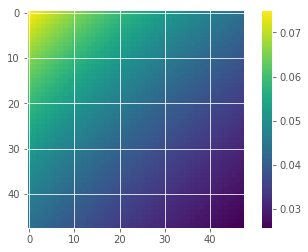

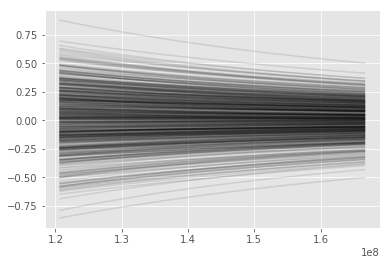

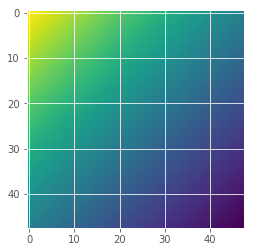

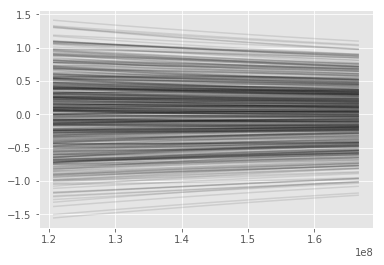

In [428]:
whiten = transform_gains(freqs,mean_amp=1.0,sigma_tec=0.01)
g_w = whiten(gains[0,...].transpose((3,0,1,2)))
g_w /= np.std(g_w,axis=-1,keepdims=True)

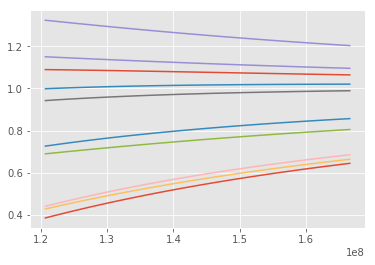

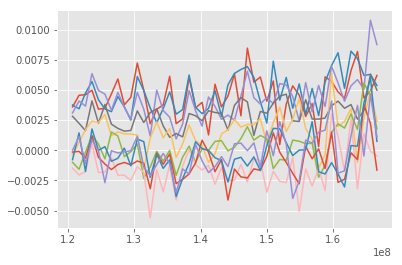

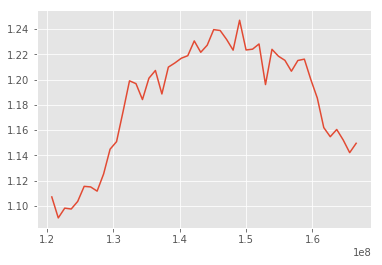

In [420]:




def m_1_0(freqs,sigma_tec):
    K=8.448e9
    return np.exp(-0.5*K**2/freqs**2 * sigma_tec**2)


def m_2_00(freqs,sigma_tec):
    K=8.448e9
    return m_1_0(freqs,sigma_tec)[:,None]*m_1_0(freqs,sigma_tec)[None,:] * np.cosh(K**2/(freqs[:,None]*freqs[None,:]) * sigma_tec**2) - m_1_0(freqs,sigma_tec)[:,None]*m_1_0(freqs,sigma_tec)[None,:] 
def m_2_11(freqs,sigma_tec):
    K=8.448e9
    return m_1_0(freqs,sigma_tec)[:,None]*m_1_0(freqs,sigma_tec)[None,:] * np.sinh(K**2/(freqs[:,None]*freqs[None,:]) * sigma_tec**2)

def simulate(sigma_tec, freqs, N=100):
    L00 = np.linalg.cholesky(m_2_00(freqs,sigma_tec) + 1e-12*np.eye(freqs.size))
    L11 = np.linalg.cholesky(m_2_11(freqs,sigma_tec) + 1e-12*np.eye(freqs.size))
    r = m_1_0(freqs,sigma_tec)[:,None] + L00.dot(np.random.normal(size=[freqs.size, N]))
    i = L11.dot(np.random.normal(size=[freqs.size, N]))
    return r + 1j*i

g = simulate(0.01,freqs,N=10)
plt.plot(freqs,g.real)
plt.show()
plt.plot(freqs,np.angle(gains[0,39,0,:,:10])*freqs[:,None]/-8.448e9)
plt.show()
plt.plot(freqs,np.exp(np.log(np.abs(gains[0,39,0,:,:])).mean(-1)))
plt.show()
g = gains[0,39,0,:,:]/np.exp(np.log(np.abs(gains[0,39,0,:,:])).mean(-1,keepdims=True))
# for s in [1e-1,5e-2,1e-2,5e-3,1e-3]:
#     L_00 = np.linalg.cholesky(m_2_00(freqs,s) + 1e-12*np.eye(freqs.size))
#     L_11 = np.linalg.cholesky(m_2_11(freqs,s) + 1e-12*np.eye(freqs.size))
#     z_00 = solve_triangular(L_00,g.real - m_1_0(freqs,s)[:,None])
#     z_11 = solve_triangular(L_11,g.imag)
#     plt.plot(freqs,g.real,c='red',alpha=0.1)
#     plt.show()
#     plt.plot(freqs,z_00,c='black',alpha=0.1)
#     plt.show()
#     plt.plot(freqs,g.imag,c='red',alpha=0.1)
#     plt.show()
#     plt.plot(freqs,z_11,c='black',alpha=0.1)
#     plt.show()

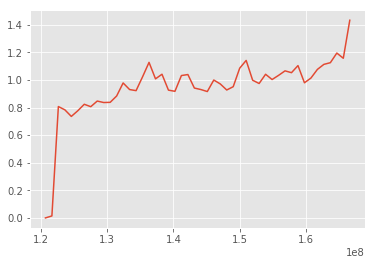

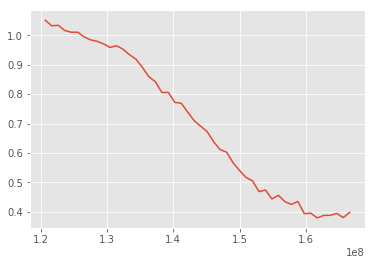

In [386]:
g_w.shape
plt.plot(freqs,g_w[50:500,39,0,:].T.std(-1).real)
plt.show()

plt.plot(freqs,gains[0,39,0,:,50:500].std(-1).real)
plt.show()

In [124]:
g_w.shape

(3600, 45, 1, 48, 1)

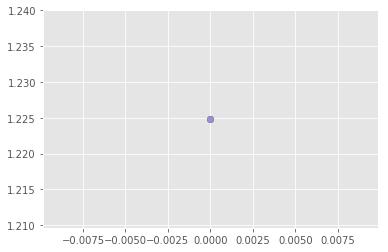

In [116]:
d = np.linalg.norm(X_a - X_a[0,:], axis=1)
for l in range(10):
    u = Y[0,30,39,:]
    plt.scatter(d[:],u[:])
plt.show()

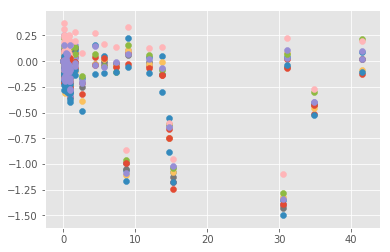

INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: -28667.862198
  Number of iterations: 2
  Number of functions evaluations: 4


INFO:tensorflow:Optimization terminated with:
  Message: b'CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH'
  Objective function value: -28667.862198
  Number of iterations: 2
  Number of functions evaluations: 4


                                     class prior transform  trainable shape  \
GPR/kern/kernels/0/lengthscales  Parameter  None       +ve       True    ()   
GPR/kern/kernels/0/variance      Parameter  None       +ve       True    ()   
GPR/kern/kernels/1/lengthscales  Parameter  None       +ve       True    ()   
GPR/kern/kernels/1/variance      Parameter  None       +ve       True    ()   
GPR/likelihood/variance          Parameter  None       +ve      False    ()   

                                 fixed_shape                value  
GPR/kern/kernels/0/lengthscales         True    76.19984897607796  
GPR/kern/kernels/0/variance             True   1.0039795950445514  
GPR/kern/kernels/1/lengthscales         True   28.469697972531364  
GPR/kern/kernels/1/variance             True    2.106147118302238  
GPR/likelihood/variance                 True  0.04000000000000001  


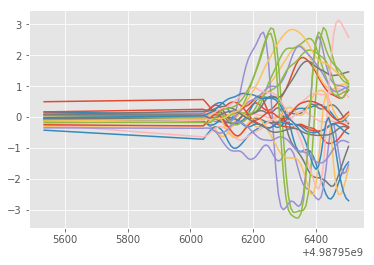

0.48491897254235655 28667.862198021914


In [459]:
d = np.linalg.norm(X_a - X_a[0,:], axis=1)
for l in range(10):
    u = np.angle(gains[0,39,:,l,30])
#     u = Y[1,30,39,:]
    plt.scatter(d[:],u[:])
    
flag_dirs = [3,27,36,9,0,16,12,24,17,11,31,20,38,35,21,34,10,1]
select = np.where(~np.isin(np.arange(len(patch_names)), np.array(flag_dirs)))[0]
plt.show()
with tf.Session(graph=tf.Graph()) as sess:
    kern = gp.kernels.Matern52(1,active_dims=[0],lengthscales=76.20)*gp.kernels.Matern12(2,active_dims=[1,2],lengthscales=28.47,variance=1.45**2)
    
    U = np.angle(gains[0,select,:,0,:]).transpose((2,1,0)).reshape((Nt*Na,-1))#Y[0,...].reshape((Nt,-1))
    m = gp.models.GPR(make_coord_array(X_t,X_a), U, kern)
    m.likelihood.variance = 0.2**2
    m.likelihood.variance.trainable = False
    gp.train.ScipyOptimizer().minimize(m)
    print(m)
    Ustar, varstar = m.predict_y(make_coord_array(X_t,X_a))
    Ustar = Ustar.reshape((Nt,Na,len(select)))
    varstar = np.sqrt( varstar.reshape((Nt,Na,len(select))))
    plt.plot(times.mjd*86400.,Ustar[:,51,:])
    plt.show()
#     plt.errorbar(d,Ustar[:,39,0,30], yerr=varstar[:,39,0,30],fmt='x')
# #     plt.fill_between(d,Ustar[:,39,0,30]-varstar[:,39,0,30],Ustar[:,39,0,30]+varstar[:,39,0,30],alpha=0.5)
#     u = np.angle(gains[0,39,:,0,30])
# #     u = Y[1,30,39,:]
#     plt.scatter(d[:],u[:])
#     plt.show()
    print(m.predict_density(make_coord_array(X_t,X_a), U).mean(), m.compute_log_likelihood())

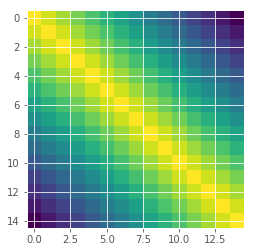

In [452]:
plt.imshow(K)
plt.show()

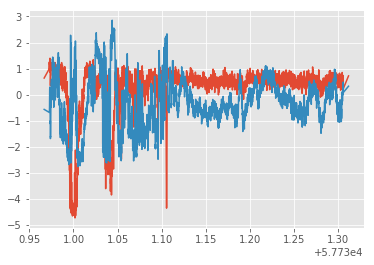

In [229]:

plt.plot(times.mjd,Y[:,:,39,0].T)
plt.show()


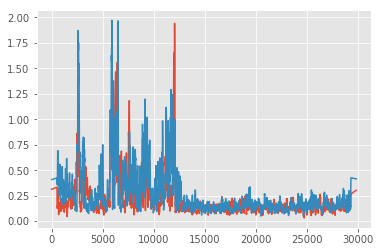

In [230]:
plt.plot(X_t[:,0], np.sqrt(Y_var[:,:,39,0].T))
plt.show()

In [12]:
from collections import namedtuple

GPParams = namedtuple("GPParams",['X','mu','K'])

def iteration_moving_activate_set(Xt, X, Xnew, Xstar, Yt, St, kern, mean, mugt1, Cgt1, predict_at_data=True, predict_at_star=True):
    """Perform one iteration of RGP.
    Args:
    :param Xt: Tensor (N, ndim) the coordinates of new data.
    :param X: Tensor (S, ndim) the coordinates of sparse basis.
    :param Xnew: Tensor (Snew, ndim) the coordinates of additional basis points.
    :param Xstar: Tensor (Sstar, ndim) the coordinates to predict the basis at.
    :param Yt: Tensor (D, N) the new data.
    :param St: Tensor (D, N) the data variance.
    :param kern: gp.kernels.Kernel the covariance of GP
        Signature: (N, ndim) -> (D, N, N)
    :param mut1: Tensor (S, D) last time step mean
    :param Ct1: Tensor (D, S, S) last time step covariance
    :param mean: callable the mean of GP, 
        Signature: (N, ndim) -> (D, N)
        
    Returns:
    basis_res: GPParams of the basis posterior to propagate
    if predict_at_star then also return:
    star_res: GPParams of the posterior not to propagate (by convention)
    If predict_at_data=True then also return:
    data_res: GPParams of the posterior at the data coordinates
    """
    
    if predict_at_star:
        #Ne=Snew+Sstar, ndim
        Xe = tf.concat([Xnew, Xstar],axis=0)
        Sstar = tf.shape(Xstar)[0]
    else:
        Xe = Xnew
    Ne = tf.shape(Xe)[0]
    Snew = tf.shape(Xnew)[0]
    N = tf.shape(Xt)[0]
    S = tf.shape(X)[0]
    
    
    #Ne+N, ndim
    Xte = tf.concat([Xe,Xt],axis=0)
    
    basis_jitter = jitter*tf.eye(tf.shape(X)[0], dtype=tf.float64)
    
    
    ###
    # Inference of basis vectors x_t|t-1
    
    ###
    # _Jt  = L^-1 Ktx
    # Jt   = Ktx Kxx^-1
    #      = Ktx (L L^T)^-1
    #      = _Jt^T L^-1
    # mupt = m(Xt) + Jt (mugt1 - m(X))
    #      = m(Xt) + _Jt^T L^-1 (mugt1 - m(X))
    # B    = Ktt - Ktx Kxx^-1 Kxt
    #      = Ktt - Ktx (L L^T)^-1 Kxt
    #      = Ktt - _Jt^T _Jt
    # Cpt  = B + Jt Cg_t1 Jt^T
    #      = B + Jt (Lg Lg^T) Jt^T
    #      = B + _Jt^T (L^-1 Lg) (Lg^T L^-T) _Jt
    #      = B + _Cpt^T _Cpt
    
    #D, Ne+N, Ne+N
    Ktt = kern.K(Xte,full_output_cov=False)
    #D, S, Ne+N
    Kxt = kern.K(X, Xte,full_output_cov=False)
    #D, S, S
    Kxx = kern.K(X,full_output_cov=False)
    #D, S, S
    L = tf.cholesky(Kxx + basis_jitter)
    
    #D, S, Ne+N
    _Jt = tf.linalg.triangular_solve(L, Kxt)
  
    #D, S, 1
    dmu = (mugt1 - mean(X))[:,:,None]
    #D, Ne+N, 1
    mupt = tf.matmul(_Jt, 
                     tf.linalg.triangular_solve(L, dmu), 
                     transpose_a=True) + mean(Xte)[:,:,None]
    
    #D, Ne+N, Ne+N
    B = Ktt - tf.matmul(_Jt, _Jt, transpose_a=True)
    #D, S, S
    Lg = tf.cholesky(Cgt1 + basis_jitter)
    
    #D, S, Ne+N
    _Cpt = tf.matmul(tf.linalg.triangular_solve(L, Lg),
                     _Jt, 
                     transpose_a = True)
    #D, Ne+N, Ne+N
    Cpt = B + tf.matmul(_Cpt,_Cpt,transpose_a=True)
    
    ###
    # Transfer extended basis
    # Cgt1    | Ggt1 Jt^T
    # -------------------
    # Jt Cgt1 | Cpt
    #
    #   a     |    b^T
    # -------------------
    #   b     |    c
    #
    # b = Jt Cgt1
    #   = _Jt^T L^-1 Cgt1
    #   = _Jt^T L^-1 (Lg Lg^T)
    #
    # qt1  = first D, S+Ne, S+Ne block
    # qpt = last D, N, N block
    # h = bottom left corner of whats left
    
    #D, S, S
    a = Cgt1
    
    #D, Ne+N, S
    b = tf.matmul(_Jt,
                 tf.linalg.triangular_solve(L, Cgt1),
                 transpose_a=True)
    #D, Ne+N, Ne+N
    c = Cpt
    
    #D, S+Ne,1
    muqt1 = tf.concat([mugt1[:,:,None],mupt[:,:Ne,:]],axis=1)
    #D, N,1
    muqpt = mupt[:,Ne:,:]
    
    #D, S+Ne, S+Ne
    Cqt1 = tf.concat([tf.concat([a,b[:,:Ne,:]],axis=1),
         tf.concat([tf.transpose(b[:,:Ne,:],(0,2,1)), c[:,:Ne,:Ne]],axis=1)],
                  axis=2)
    
    #D, N, N
    Cqpt = c[:,Ne:, Ne:]
    #D, N, S+Ne
    h = tf.concat([b[:,Ne:,:], c[:,Ne:,:Ne]],axis=2)
    
    ###
    # Update x_t|t
    # muqt = muqt1 + h^T (Cqpt + St)^-1 (Yt - mupt)
    #      = muqt1 + h^T (Ls Ls^T)^-1 (Yt - mupt)
    #      = mugt1 + _Cqt^T  _dY
    # Cqt  = Cqt1 - h^T (Cqpt + St)^-1 h
    #      = Cqt1 - h^T (Ls Ls^T)^-1 h
    #      = Cqt1 - _Cqt^T _Cqt
    # update at data
    # muet = muqpt + Cqpt (Cqpt + St)^-1 (Yt - mupt)
    #      = muqpt + Cqpt (Ls Ls^t)^-1 (Yt - mupt)
    #      = muqpt + _Cet^T _dY
    # Cet  = Cqpt - Cqpt (Cqpt + St)^-1 Cqpt
    #      = Cqpt - Cqpt (Ls Ls^T)^-1 Cqpt
    #      = Cqpt - _Cet^T _Cet
    # Cget = Cet h^T Cqpt^-1
    
    
    #D, N, N
    Ls = tf.cholesky(Cqpt + tf.matrix_diag(St))
    #D, N, S+Ne
    _Cqt = tf.linalg.triangular_solve(Ls, h)
    
    #D, N,1
    _dY = tf.linalg.triangular_solve(Ls, Yt[:,:,None] - muqpt)
    
    #D, S+Ne, 1
    muqt = muqt1 + tf.matmul(_Cqt, _dY, transpose_a=True)
    #D, S+Ne, S+Ne
    Cqt = Cqt1 - tf.matmul(_Cqt, _Cqt, transpose_a=True)
    
    #D, N, N
    _Cet = tf.linalg.triangular_solve(Ls, Cqpt)
    #D, N, 1
    muet = muqpt + tf.matmul(_Cet, _dY,transpose_a=True)
    #D, N, N
    Cet = Cqpt + tf.matmul(_Cet, _Cet, transpose_a=True)
    
    ###
    # split basis propagated solutions and predict
    # Ne = Snew + Sstar
    
    #S+Snew, ndim
    Xnext = tf.concat([X,Xnew],axis=0)
    Snext = tf.shape(Xnext)[0]
    #D, Snext
    #D, Snext, Snext
    basis_res = GPParams(Xnext, muqt[:, :Snext, 0], Cqt[:, :Snext, :Snext])
    
    if predict_at_star:
        #Sstar, ndims
        #D, Sstar
        #D, Sstar, Sstar
        star_res = GPParams(Xstar, muqt[:, Snext:, 0], Cqt[:, Snext:, Snext:])
    else:
        star_res = GPParams(None, None, None)
    if predict_at_data:
        #N, ndims
        #D, N
        #D, N, N
        data_res = GPParams(Xt, muet, Cet)
        if predict_at_star:
            return basis_res, star_res, data_res
        return basis_res, data_res
    if predict_at_star:
        return basis_res, star_res
    return basis_res

In [13]:
# def solve_ant(X, Y, Y_var, output_folder='./test_solve_ant'):
#     """Solve the gains of an ant.
#     :param X: array (Nd, Nt, 3)
#     :param Y: array (2, Nd, Nt)
#     :param Y_var: array (2, Nd, Nt)
    
#     Assumes Y is zero mean and unit variance.
#     """

output_folder='./test_solve_ant_moving'
import os
os.makedirs(output_folder,exist_ok=True)
import pylab as plt
plt.style.use('ggplot')
D, Nt, Nd, Na = Y.shape

def _get_data(i):
    return X[i,:,:,:].reshape((-1,5)), Y[:,i,:,:].reshape((D,-1)), Y_var[:,i,:,:].reshape((D,-1))

Xb_t = basis_time(X_t[0,0],dt=15.,N=40)
Xb_d = basis_directions(X_d,f_min=0.5, f_max=0.75, fov=5.0, N=7, dialate=False)
Xb_a = basis_antennas(X_a,N=1)

Nremove = Xb_d.shape[0]*Xb_a.shape[0]

#Nt, Nd, Na, 5
_Xb = make_coord_array(Xb_t, Xb_d, Xb_a, flat=False)

Xb = _Xb.reshape((-1,5))

with tf.Session(graph=tf.Graph()) as sess:
    #basis vectors to propagate
    X_pl = tf.placeholder(tf.float64)
    X_new_pl = tf.placeholder(tf.float64)
    X_star_pl = tf.placeholder(tf.float64)
    Yt_pl = tf.placeholder(tf.float64)
    Xt_pl = tf.placeholder(tf.float64)
    St_pl = tf.placeholder(tf.float64)
    kern_time = gp.kernels.Matern52(1, active_dims = slice(0,1,1))
    kern_time.lengthscales = 78.
    kern_dir = gp.kernels.RBF(2, active_dims = slice(1,3,1))
    kern_dir.lengthscales = 1.
    kern_ant = gp.kernels.Matern12(2, active_dims = slice(3,5,1))
    kern_ant.lengthscales = 28.
    kern = gp.multioutput.SharedIndependentMok(kern_time*kern_dir*kern_ant,Y.shape[0])

    mean = lambda X: tf.zeros([Y.shape[0], tf.shape(X)[0]], dtype=tf.float64)

    mut1_pl = tf.placeholder(tf.float64)
    Ct1_pl = tf.placeholder(tf.float64)

    mu0 = mean(X_pl)
    C0 = kern.K(X_pl,full_output_cov=False)

    #(Xt, X, Xnew, Xstar, Yt, St, kern, mean, mugt1, Cgt1, predict_at_data=True, predict_at_star=True)
    basis_res, data_res  = iteration_moving_activate_set(Xt_pl, X_pl, X_new_pl, None, Yt_pl, St_pl, 
                                                         kern, mean, mut1_pl, Ct1_pl, 
                                                         predict_at_data=True, predict_at_star=True)
    ###
    #


    mut1, Ct1 = sess.run([mu0,C0],{X_pl:Xb})
    mus = []
    Cs = []
    Xs = []


    t0 = default_timer()
    for i in range(Nt):
        Xb_t = basis_time(X_t[i,0],dt=15.,N=40)[-1:,:]
        _Xb_new = make_coord_array(Xb_t, Xb_d, Xb_a, flat=False)
        Xb_new = _Xb_new.reshape((-1,5))
        
        
        
        data = _get_data(i)
        print(data[0].shape,data[1].shape, data[2].shape, Xb.shape, Xb_new.shape)
        feed_dict = {Xt_pl:data[0], X_pl:Xb, X_new_pl: Xb_new, #X_star_pl: data[4],
                Yt_pl:data[1], St_pl:data[2],
                mut1_pl:mut1, Ct1_pl:Ct1}
        _basis_res, _data_res = sess.run([basis_res, data_res],feed_dict)
        ###
        # truncate basis (remove first)
        Xb = _basis_res.X[Nremove:, :]
        mut1 = _basis_res.mu[:,Nremove:]
        Ct1 = _basis_res.K[:, Nremove:, Nremove:]
        
        ###
        # Save data_res
        
        Xs.append(_data_res.X.reshape(1,Nd,Na,5))
        mus.append(_data_res.mu.reshape((2, 1, Nd, Na)))
        Cs.append([np.sqrt(np.diag(_data_res.K[0,:,:])).reshape((1, Nd, Na)), 
                   np.sqrt(np.diag(_data_res.K[1,:,:])).reshape((1, Nd, Na))])
        
        if (i+1)%1==0:
            num_left = Nt - i - 1
            num_done = i + 1
            dt = default_timer() - t0
            rate = dt / num_done
            print("{} | {:.2f} / s | {:.2f} s remain".format(num_done, 1./rate, num_left * rate))

#         plt.plot(X[dir_idx,:_Nt,2],Y[:,dir_idx,:_Nt].T,alpha=0.3)
#         plt.plot(_X_b[dir_idx, :, 2],mus[-1][:,dir_idx,:].T,c=plt.cm.terrain(i/Nt))
#         plt.errorbar(_X_b[dir_idx, :, 2],mus[-1][0,dir_idx,:],yerr=np.sqrt(Cs[-1][0][dir_idx,:]))
#         plt.errorbar(_X_b[dir_idx, :, 2],mus[-1][1,dir_idx,:],yerr=np.sqrt(Cs[-1][1][dir_idx,:]))
#         plt.vlines(data[0][dir_idx,2],-1,1)
#         plt.savefig(os.path.join(output_folder,"fig{:04d}.png".format(i)))
#         plt.close('all')
    

/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/scipy/cluster/vq.py:525: UserWarning: One of the clusters is empty. Re-run kmeans with a different initialization.
  warnings.warn("One of the clusters is empty. "


(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1 | 1.30 / s | 2764.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2 | 1.37 / s | 2626.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3 | 1.39 / s | 2588.34 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
4 | 1.39 / s | 2577.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
5 | 1.41 / s | 2549.04 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
6 | 1.42 / s | 2537.74 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
7 | 1.41 / s | 2539.73 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
8 | 1.42 / s | 2535.54 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
9 | 1.42 / s | 2529.10 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
10 | 1.42 / s | 2527.87 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
11 | 1.42 / s | 2525.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
12 | 1.41 / s | 2535.84 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
13 | 1.42 / s | 2534.18 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) 

110 | 0.66 / s | 5298.28 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
111 | 0.66 / s | 5285.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
112 | 0.66 / s | 5272.96 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
113 | 0.66 / s | 5259.95 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
114 | 0.66 / s | 5246.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
115 | 0.67 / s | 5233.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
116 | 0.67 / s | 5221.09 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
117 | 0.67 / s | 5207.94 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
118 | 0.67 / s | 5195.28 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
119 | 0.67 / s | 5183.50 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
120 | 0.67 / s | 5170.96 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
121 | 0.67 / s | 5158.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
122 | 0.68 / s | 5145.13 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
123 | 0.68 /

218 | 0.78 / s | 4315.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
219 | 0.78 / s | 4308.44 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
220 | 0.79 / s | 4300.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
221 | 0.79 / s | 4293.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
222 | 0.79 / s | 4286.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
223 | 0.79 / s | 4278.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
224 | 0.79 / s | 4271.02 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
225 | 0.79 / s | 4263.50 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
226 | 0.79 / s | 4256.25 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
227 | 0.79 / s | 4249.06 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
228 | 0.79 / s | 4241.77 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
229 | 0.80 / s | 4234.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
230 | 0.80 / s | 4227.59 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
231 | 0.80 /

326 | 0.88 / s | 3720.41 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
327 | 0.88 / s | 3716.35 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
328 | 0.88 / s | 3712.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
329 | 0.88 / s | 3708.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
330 | 0.88 / s | 3704.56 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
331 | 0.88 / s | 3700.94 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
332 | 0.88 / s | 3697.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
333 | 0.88 / s | 3693.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
334 | 0.89 / s | 3689.32 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
335 | 0.89 / s | 3684.86 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
336 | 0.89 / s | 3680.70 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
337 | 0.89 / s | 3676.04 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
338 | 0.89 / s | 3671.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
339 | 0.89 /

434 | 0.95 / s | 3346.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
435 | 0.95 / s | 3343.45 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
436 | 0.95 / s | 3340.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
437 | 0.95 / s | 3337.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
438 | 0.95 / s | 3335.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
439 | 0.95 / s | 3332.50 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
440 | 0.95 / s | 3329.69 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
441 | 0.95 / s | 3326.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
442 | 0.95 / s | 3324.22 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
443 | 0.95 / s | 3321.64 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
444 | 0.95 / s | 3318.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
445 | 0.95 / s | 3316.04 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
446 | 0.95 / s | 3313.26 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
447 | 0.95 /

542 | 0.99 / s | 3094.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
543 | 0.99 / s | 3093.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
544 | 0.99 / s | 3090.96 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
545 | 0.99 / s | 3088.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
546 | 0.99 / s | 3086.70 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
547 | 0.99 / s | 3084.55 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
548 | 0.99 / s | 3082.39 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
549 | 0.99 / s | 3080.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
550 | 0.99 / s | 3078.14 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
551 | 0.99 / s | 3075.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
552 | 0.99 / s | 3073.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
553 | 0.99 / s | 3071.80 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
554 | 0.99 / s | 3069.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
555 | 0.99 /

650 | 1.01 / s | 2908.70 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
651 | 1.01 / s | 2907.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
652 | 1.01 / s | 2905.60 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
653 | 1.01 / s | 2904.36 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
654 | 1.01 / s | 2903.17 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
655 | 1.01 / s | 2901.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
656 | 1.01 / s | 2900.85 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
657 | 1.01 / s | 2899.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
658 | 1.01 / s | 2898.55 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
659 | 1.02 / s | 2897.42 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
660 | 1.02 / s | 2896.26 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
661 | 1.02 / s | 2894.96 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
662 | 1.02 / s | 2893.71 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
663 | 1.02 /

758 | 1.03 / s | 2753.14 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
759 | 1.03 / s | 2751.80 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
760 | 1.03 / s | 2750.28 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
761 | 1.03 / s | 2748.74 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
762 | 1.03 / s | 2747.22 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
763 | 1.03 / s | 2745.64 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
764 | 1.03 / s | 2744.12 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
765 | 1.03 / s | 2742.61 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
766 | 1.03 / s | 2741.03 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
767 | 1.03 / s | 2739.47 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
768 | 1.03 / s | 2738.02 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
769 | 1.03 / s | 2736.69 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
770 | 1.03 / s | 2735.25 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
771 | 1.03 /

866 | 1.05 / s | 2594.62 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
867 | 1.05 / s | 2593.25 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
868 | 1.05 / s | 2591.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
869 | 1.05 / s | 2590.56 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
870 | 1.05 / s | 2589.27 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
871 | 1.05 / s | 2587.99 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
872 | 1.05 / s | 2586.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
873 | 1.05 / s | 2585.38 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
874 | 1.05 / s | 2584.06 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
875 | 1.06 / s | 2582.73 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
876 | 1.06 / s | 2581.43 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
877 | 1.06 / s | 2580.09 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
878 | 1.06 / s | 2578.76 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
879 | 1.06 /

974 | 1.07 / s | 2457.97 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
975 | 1.07 / s | 2456.80 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
976 | 1.07 / s | 2455.61 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
977 | 1.07 / s | 2454.42 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
978 | 1.07 / s | 2453.21 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
979 | 1.07 / s | 2452.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
980 | 1.07 / s | 2450.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
981 | 1.07 / s | 2449.55 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
982 | 1.07 / s | 2448.32 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
983 | 1.07 / s | 2447.10 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
984 | 1.07 / s | 2445.87 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
985 | 1.07 / s | 2444.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
986 | 1.07 / s | 2443.44 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
987 | 1.07 /

1081 | 1.08 / s | 2327.32 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1082 | 1.08 / s | 2326.10 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1083 | 1.08 / s | 2324.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1084 | 1.08 / s | 2323.75 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1085 | 1.08 / s | 2322.56 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1086 | 1.08 / s | 2321.40 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1087 | 1.08 / s | 2320.19 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1088 | 1.08 / s | 2318.99 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1089 | 1.08 / s | 2317.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1090 | 1.08 / s | 2316.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1091 | 1.08 / s | 2315.51 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1092 | 1.08 / s | 2314.34 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1093 | 1.08 / s | 2313.17 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1188 | 1.09 / s | 2204.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1189 | 1.09 / s | 2203.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1190 | 1.09 / s | 2202.58 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1191 | 1.09 / s | 2201.52 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1192 | 1.09 / s | 2200.47 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1193 | 1.09 / s | 2199.37 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1194 | 1.09 / s | 2198.23 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1195 | 1.09 / s | 2197.12 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1196 | 1.09 / s | 2196.02 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1197 | 1.09 / s | 2194.92 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1198 | 1.09 / s | 2193.82 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1199 | 1.09 / s | 2192.74 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1200 | 1.10 / s | 2191.66 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1295 | 1.10 / s | 2087.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1296 | 1.10 / s | 2086.86 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1297 | 1.10 / s | 2085.82 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1298 | 1.10 / s | 2084.75 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1299 | 1.10 / s | 2083.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1300 | 1.10 / s | 2082.61 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1301 | 1.10 / s | 2081.56 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1302 | 1.10 / s | 2080.49 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1303 | 1.10 / s | 2079.47 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1304 | 1.10 / s | 2078.41 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1305 | 1.10 / s | 2077.33 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1306 | 1.10 / s | 2076.28 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1307 | 1.10 / s | 2075.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1402 | 1.11 / s | 1975.99 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1403 | 1.11 / s | 1974.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1404 | 1.11 / s | 1973.94 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1405 | 1.11 / s | 1972.92 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1406 | 1.11 / s | 1971.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1407 | 1.11 / s | 1970.85 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1408 | 1.11 / s | 1970.07 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1409 | 1.11 / s | 1969.23 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1410 | 1.11 / s | 1968.36 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1411 | 1.11 / s | 1967.51 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1412 | 1.11 / s | 1966.63 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1413 | 1.11 / s | 1965.78 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1414 | 1.11 / s | 1964.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1509 | 1.11 / s | 1880.55 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1510 | 1.11 / s | 1879.60 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1511 | 1.11 / s | 1878.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1512 | 1.11 / s | 1877.75 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1513 | 1.11 / s | 1876.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1514 | 1.11 / s | 1875.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1515 | 1.11 / s | 1874.87 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1516 | 1.11 / s | 1873.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1517 | 1.11 / s | 1872.96 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1518 | 1.11 / s | 1871.99 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1519 | 1.11 / s | 1871.03 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1520 | 1.11 / s | 1870.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1521 | 1.11 / s | 1869.09 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1616 | 1.12 / s | 1774.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1617 | 1.12 / s | 1773.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1618 | 1.12 / s | 1772.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1619 | 1.12 / s | 1771.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1620 | 1.12 / s | 1770.80 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1621 | 1.12 / s | 1769.82 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1622 | 1.12 / s | 1768.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1623 | 1.12 / s | 1767.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1624 | 1.12 / s | 1766.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1625 | 1.12 / s | 1765.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1626 | 1.12 / s | 1764.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1627 | 1.12 / s | 1763.84 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1628 | 1.12 / s | 1762.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1723 | 1.12 / s | 1670.03 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1724 | 1.12 / s | 1669.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1725 | 1.12 / s | 1668.08 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1726 | 1.12 / s | 1667.11 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1727 | 1.12 / s | 1666.14 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1728 | 1.12 / s | 1665.17 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1729 | 1.12 / s | 1664.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1730 | 1.12 / s | 1663.24 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1731 | 1.12 / s | 1662.26 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1732 | 1.12 / s | 1661.28 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1733 | 1.12 / s | 1660.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1734 | 1.12 / s | 1659.32 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1735 | 1.12 / s | 1658.34 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1830 | 1.13 / s | 1568.18 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1831 | 1.13 / s | 1567.24 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1832 | 1.13 / s | 1566.29 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1833 | 1.13 / s | 1565.34 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1834 | 1.13 / s | 1564.39 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1835 | 1.13 / s | 1563.47 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1836 | 1.13 / s | 1562.53 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1837 | 1.13 / s | 1561.59 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1838 | 1.13 / s | 1560.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1839 | 1.13 / s | 1559.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1840 | 1.13 / s | 1558.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1841 | 1.13 / s | 1558.02 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1842 | 1.13 / s | 1557.08 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

1937 | 1.13 / s | 1475.07 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1938 | 1.13 / s | 1474.19 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1939 | 1.13 / s | 1473.32 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1940 | 1.13 / s | 1472.43 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1941 | 1.13 / s | 1471.54 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1942 | 1.13 / s | 1470.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1943 | 1.13 / s | 1469.76 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1944 | 1.13 / s | 1468.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1945 | 1.13 / s | 1468.00 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1946 | 1.13 / s | 1467.10 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1947 | 1.13 / s | 1466.23 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1948 | 1.13 / s | 1465.33 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
1949 | 1.13 / s | 1464.44 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

2044 | 1.13 / s | 1378.12 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2045 | 1.13 / s | 1378.52 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2046 | 1.13 / s | 1378.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2047 | 1.13 / s | 1379.27 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2048 | 1.12 / s | 1379.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2049 | 1.12 / s | 1380.04 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2050 | 1.12 / s | 1380.46 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2051 | 1.12 / s | 1380.85 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2052 | 1.12 / s | 1381.28 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2053 | 1.12 / s | 1381.62 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2054 | 1.12 / s | 1382.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2055 | 1.12 / s | 1382.36 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2056 | 1.12 / s | 1382.46 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

2151 | 1.09 / s | 1330.97 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2152 | 1.09 / s | 1330.14 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2153 | 1.09 / s | 1329.29 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2154 | 1.09 / s | 1328.44 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2155 | 1.09 / s | 1327.61 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2156 | 1.09 / s | 1326.77 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2157 | 1.09 / s | 1325.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2158 | 1.09 / s | 1325.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2159 | 1.09 / s | 1324.19 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2160 | 1.09 / s | 1323.33 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2161 | 1.09 / s | 1322.46 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2162 | 1.09 / s | 1321.60 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2163 | 1.09 / s | 1320.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

2258 | 1.09 / s | 1232.12 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2259 | 1.09 / s | 1231.16 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2260 | 1.09 / s | 1230.18 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2261 | 1.09 / s | 1229.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2262 | 1.09 / s | 1228.24 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2263 | 1.09 / s | 1227.27 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2264 | 1.09 / s | 1226.31 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2265 | 1.09 / s | 1225.33 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2266 | 1.09 / s | 1224.35 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2267 | 1.09 / s | 1223.39 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2268 | 1.09 / s | 1222.42 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2269 | 1.09 / s | 1221.46 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2270 | 1.09 / s | 1220.49 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

2365 | 1.08 / s | 1140.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2366 | 1.08 / s | 1139.37 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2367 | 1.08 / s | 1138.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2368 | 1.08 / s | 1138.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2369 | 1.08 / s | 1137.35 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2370 | 1.08 / s | 1136.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2371 | 1.08 / s | 1135.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2372 | 1.08 / s | 1135.26 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2373 | 1.08 / s | 1134.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2374 | 1.08 / s | 1134.15 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2375 | 1.08 / s | 1134.15 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2376 | 1.08 / s | 1134.11 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2377 | 1.08 / s | 1134.10 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

2472 | 1.06 / s | 1061.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2473 | 1.06 / s | 1060.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2474 | 1.06 / s | 1059.82 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2475 | 1.06 / s | 1058.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2476 | 1.06 / s | 1057.85 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2477 | 1.06 / s | 1056.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2478 | 1.06 / s | 1055.89 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2479 | 1.06 / s | 1054.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2480 | 1.06 / s | 1053.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2481 | 1.06 / s | 1052.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2482 | 1.06 / s | 1051.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2483 | 1.06 / s | 1050.94 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2484 | 1.06 / s | 1049.95 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)

2579 | 1.07 / s | 957.46 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2580 | 1.07 / s | 956.53 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2581 | 1.07 / s | 955.62 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2582 | 1.07 / s | 954.66 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2583 | 1.07 / s | 953.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2584 | 1.07 / s | 952.77 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2585 | 1.07 / s | 951.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2586 | 1.07 / s | 950.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2587 | 1.07 / s | 949.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2588 | 1.07 / s | 948.87 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2589 | 1.07 / s | 947.89 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2590 | 1.07 / s | 946.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2591 | 1.07 / s | 945.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2592 | 1.07 

2687 | 1.07 / s | 853.39 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2688 | 1.07 / s | 852.43 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2689 | 1.07 / s | 851.46 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2690 | 1.07 / s | 850.51 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2691 | 1.07 / s | 849.54 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2692 | 1.07 / s | 848.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2693 | 1.07 / s | 847.62 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2694 | 1.07 / s | 846.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2695 | 1.07 / s | 845.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2696 | 1.07 / s | 844.77 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2697 | 1.07 / s | 843.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2698 | 1.07 / s | 842.89 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2699 | 1.07 / s | 841.95 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2700 | 1.07 

2795 | 1.07 / s | 750.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2796 | 1.07 / s | 749.70 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2797 | 1.07 / s | 748.76 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2798 | 1.07 / s | 747.82 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2799 | 1.07 / s | 746.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2800 | 1.07 / s | 745.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2801 | 1.07 / s | 744.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2802 | 1.07 / s | 744.03 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2803 | 1.07 / s | 743.08 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2804 | 1.07 / s | 742.16 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2805 | 1.07 / s | 741.22 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2806 | 1.07 / s | 740.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2807 | 1.07 / s | 739.35 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2808 | 1.07 

2903 | 1.07 / s | 648.67 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2904 | 1.07 / s | 647.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2905 | 1.07 / s | 646.77 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2906 | 1.07 / s | 645.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2907 | 1.07 / s | 644.88 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2908 | 1.07 / s | 643.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2909 | 1.07 / s | 642.99 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2910 | 1.07 / s | 642.04 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2911 | 1.07 / s | 641.09 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2912 | 1.07 / s | 640.14 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2913 | 1.07 / s | 639.21 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2914 | 1.07 / s | 638.26 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2915 | 1.07 / s | 637.31 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
2916 | 1.07 

3011 | 1.08 / s | 547.66 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3012 | 1.08 / s | 546.72 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3013 | 1.08 / s | 545.77 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3014 | 1.08 / s | 544.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3015 | 1.08 / s | 543.89 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3016 | 1.08 / s | 542.94 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3017 | 1.08 / s | 542.00 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3018 | 1.08 / s | 541.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3019 | 1.08 / s | 540.11 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3020 | 1.08 / s | 539.16 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3021 | 1.08 / s | 538.22 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3022 | 1.08 / s | 537.27 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3023 | 1.08 / s | 536.33 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3024 | 1.08 

3119 | 1.08 / s | 446.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3120 | 1.08 / s | 445.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3121 | 1.08 / s | 444.73 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3122 | 1.08 / s | 443.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3123 | 1.08 / s | 442.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3124 | 1.08 / s | 441.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3125 | 1.08 / s | 441.06 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3126 | 1.08 / s | 440.14 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3127 | 1.08 / s | 439.21 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3128 | 1.08 / s | 438.29 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3129 | 1.08 / s | 437.37 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3130 | 1.08 / s | 436.45 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3131 | 1.08 / s | 435.52 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3132 | 1.08 

3227 | 1.08 / s | 346.22 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3228 | 1.08 / s | 345.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3229 | 1.08 / s | 344.37 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3230 | 1.08 / s | 343.45 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3231 | 1.08 / s | 342.52 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3232 | 1.08 / s | 341.60 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3233 | 1.08 / s | 340.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3234 | 1.08 / s | 339.75 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3235 | 1.08 / s | 338.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3236 | 1.08 / s | 337.90 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3237 | 1.08 / s | 336.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3238 | 1.08 / s | 336.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3239 | 1.08 / s | 335.13 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3240 | 1.08 

3335 | 1.08 / s | 245.89 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3336 | 1.08 / s | 244.97 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3337 | 1.08 / s | 244.04 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3338 | 1.08 / s | 243.12 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3339 | 1.08 / s | 242.20 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3340 | 1.08 / s | 241.27 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3341 | 1.08 / s | 240.35 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3342 | 1.08 / s | 239.42 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3343 | 1.08 / s | 238.50 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3344 | 1.08 / s | 237.58 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3345 | 1.08 / s | 236.65 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3346 | 1.08 / s | 235.73 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3347 | 1.08 / s | 234.81 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3348 | 1.08 

3443 | 1.08 / s | 145.47 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3444 | 1.08 / s | 144.54 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3445 | 1.08 / s | 143.61 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3446 | 1.08 / s | 142.68 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3447 | 1.08 / s | 141.75 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3448 | 1.08 / s | 140.83 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3449 | 1.08 / s | 139.91 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3450 | 1.08 / s | 138.98 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3451 | 1.08 / s | 138.05 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3452 | 1.08 / s | 137.13 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3453 | 1.08 / s | 136.19 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3454 | 1.08 / s | 135.26 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3455 | 1.08 / s | 134.33 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3456 | 1.08 

3552 | 1.08 / s | 44.42 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3553 | 1.08 / s | 43.49 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3554 | 1.08 / s | 42.57 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3555 | 1.08 / s | 41.64 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3556 | 1.08 / s | 40.71 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3557 | 1.08 / s | 39.79 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3558 | 1.08 / s | 38.86 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3559 | 1.08 / s | 37.93 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3560 | 1.08 / s | 37.01 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3561 | 1.08 / s | 36.08 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3562 | 1.08 / s | 35.15 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3563 | 1.08 / s | 34.23 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3564 | 1.08 / s | 33.30 s remain
(45, 5) (2, 45) (2, 45) (1960, 5) (49, 5)
3565 | 1.08 / s | 32.38 s

IndexError: index 3600 is out of bounds for axis 0 with size 3600

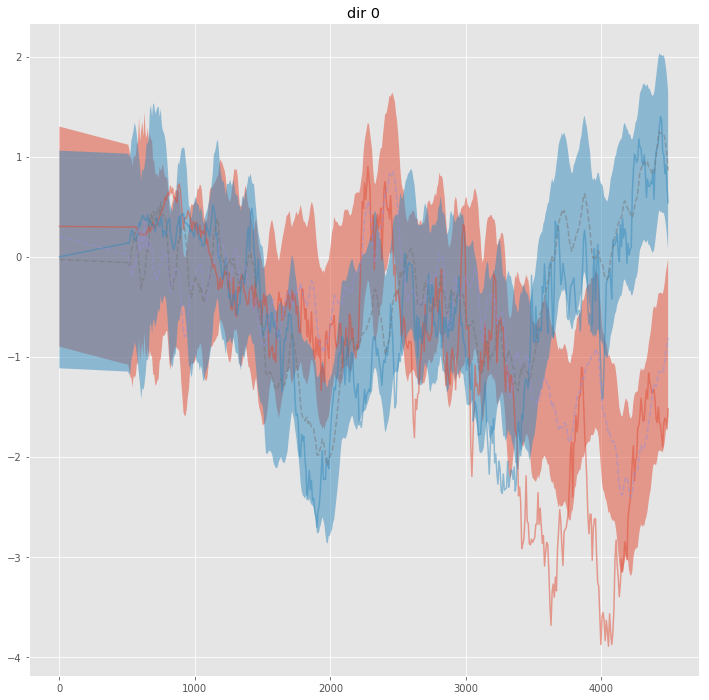

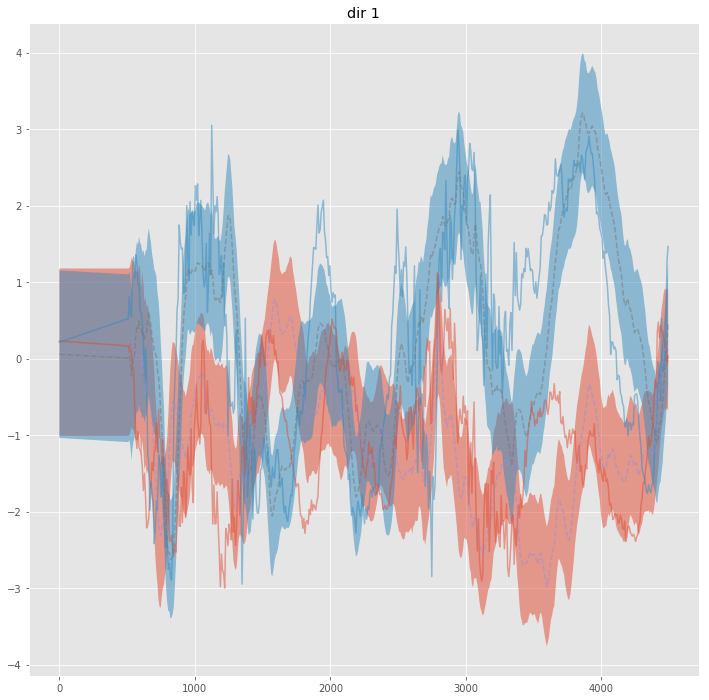

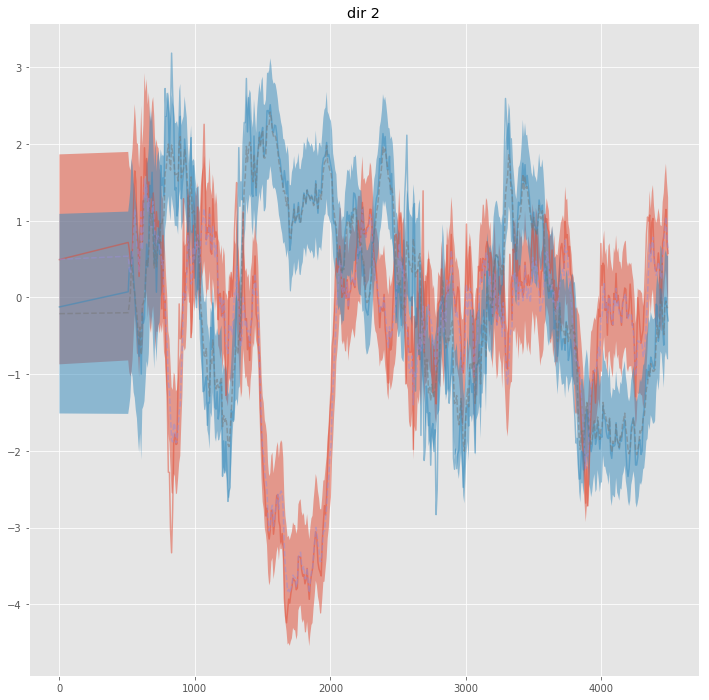

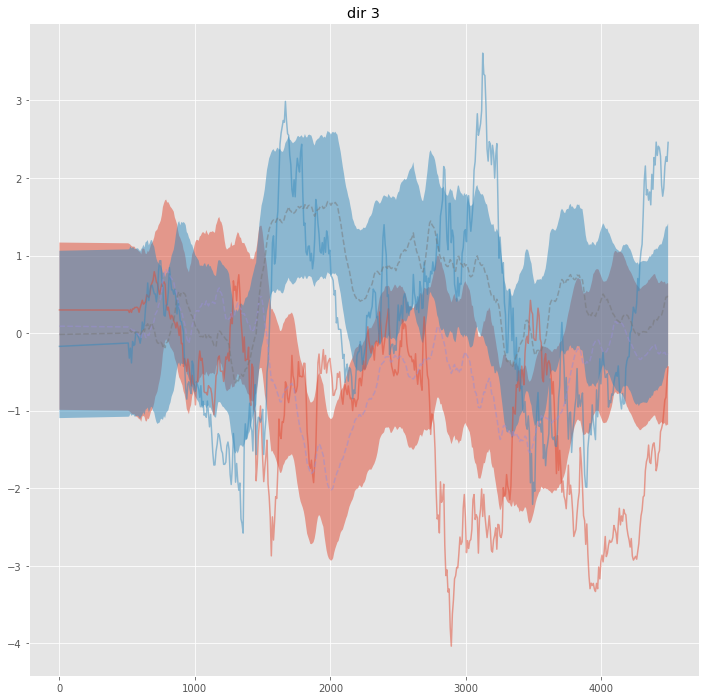

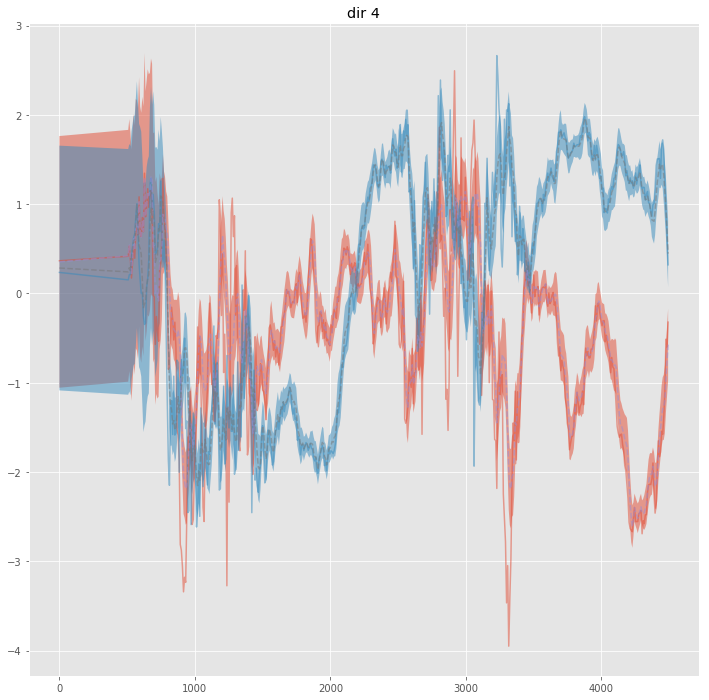

...

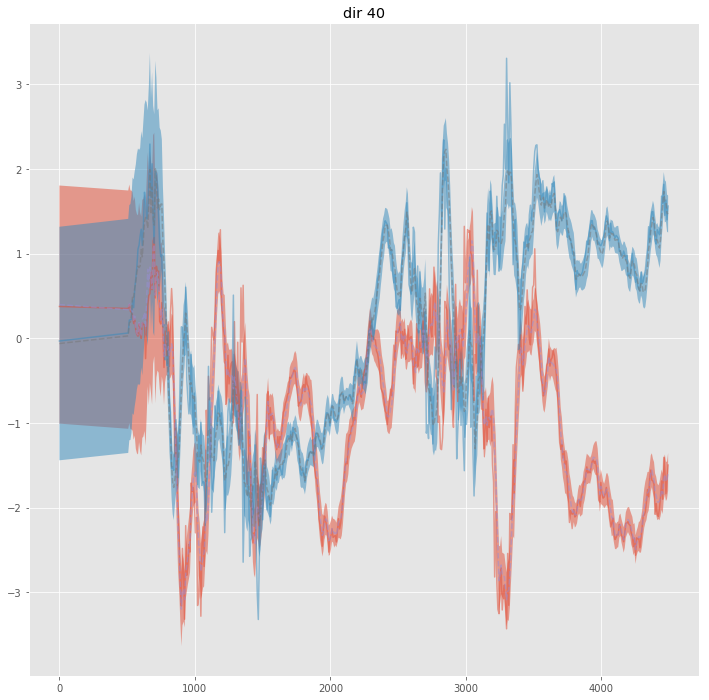

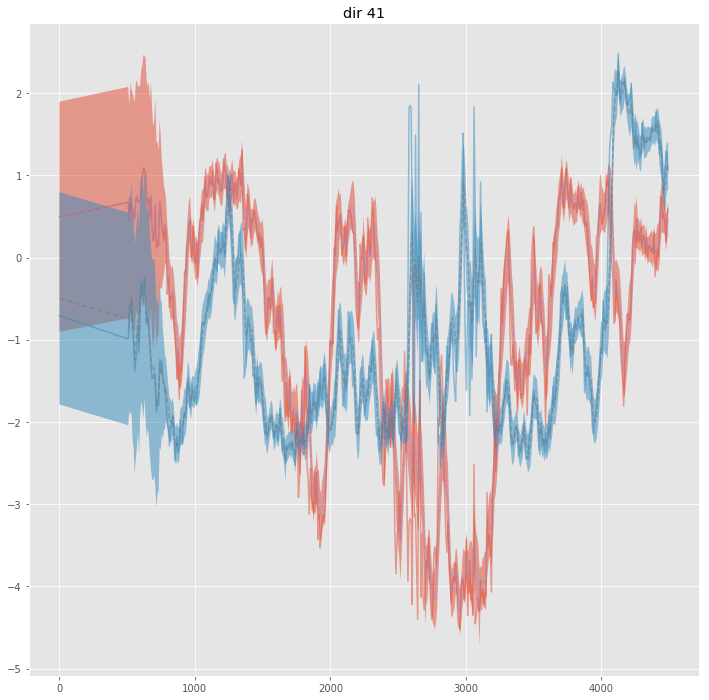

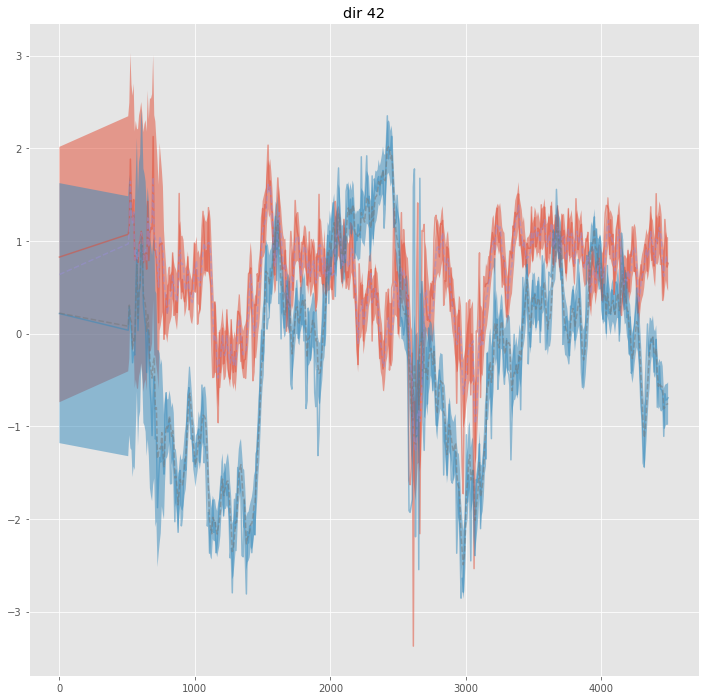

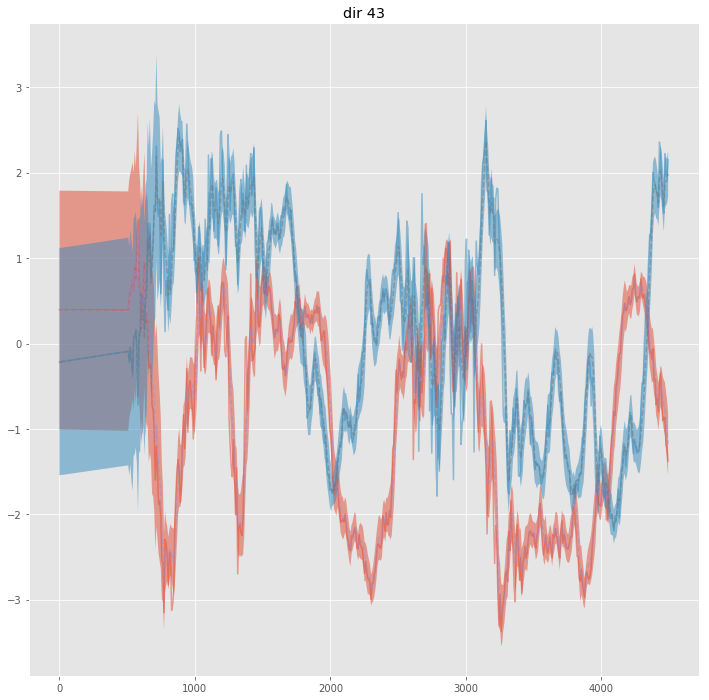

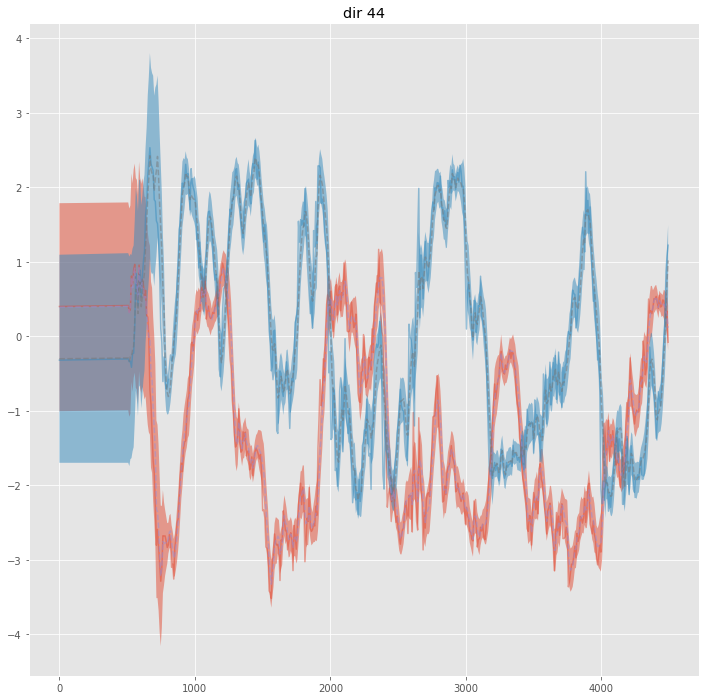

In [35]:

_Nt = 500
for dir_idx in range(45):
    plt.figure(figsize=(12,12))
    plt.plot(X_t[:_Nt,0],Y[:,:_Nt,dir_idx,0].T,alpha=0.5)
    plt.plot(Xs[:_Nt,0,dir_idx,0,0], mus[:_Nt,:,0,dir_idx,0],alpha=0.5,ls='--')
    plt.fill_between(Xs[:_Nt,0,dir_idx,0,0], 
                     mus[:_Nt,0,0,dir_idx,0] - Cs[:_Nt,0,0,dir_idx,0], 
                     mus[:_Nt,0,0,dir_idx,0] + Cs[:_Nt,0,0,dir_idx,0],alpha=0.5)
    plt.fill_between(Xs[:_Nt,0,dir_idx,0,0], 
                     mus[:_Nt,1,0,dir_idx,0] - Cs[:_Nt,1,0,dir_idx,0], 
                     mus[:_Nt,1,0,dir_idx,0] + Cs[:_Nt,1,0,dir_idx,0],alpha=0.5)
    plt.title("dir {}".format(dir_idx))
    plt.show()
#     for i in range(Nt):        
        
#         plt.plot(Xs[i][0,dir_idx,0,0],[dir_idx, :, 2],mus[i][:,dir_idx,:].T,c=plt.cm.terrain(i/Nt))
#         plt.errorbar(_X_b[dir_idx, :, 2],mus[i][0,dir_idx,:],yerr=np.sqrt(Cs[i][0][dir_idx,:]))
#         plt.errorbar(_X_b[dir_idx, :, 2],mus[i][1,dir_idx,:],yerr=np.sqrt(Cs[i][1][dir_idx,:]))
#         plt.vlines(X[dir_idx,i,2],-1,1)
#         plt.savefig(os.path.join(output_folder,"fig_{:02d}_{:04d}.png".format(dir_idx, i)))
#         plt.close('all')

(45, 1, 1, 3599)


In [19]:
mus = np.stack(mus,axis=0)
Cs = np.stack(Cs,axis=0)
Xs = np.stack(Xs, axis=0)

## Single computation exectution version

Only one call to the computation gaph need be made.

In [6]:
import tensorflow as tf
import numpy as np
import gpflow as gp

jitter = 1e-6

def make_solsets(datapack,output_solset, screen_res=15, extend = 0.25, solset='sol000'):
    screen_solset = "screen_{}".format(output_solset)
    
    datapack.switch_solset(solset)
    datapack.select(ant=None,time=None, dir=None, freq=None, pol=slice(0,1,1))
    axes = datapack.__getattr__("axes_{}".format('phase'))

    antenna_labels, antennas = datapack.get_antennas(axes['ant'])
    patch_names, directions = datapack.get_sources(axes['dir'])
    timestamps, times = datapack.get_times(axes['time'])
    freq_labels, freqs = datapack.get_freqs(axes['freq'])
    pol_labels, pols = datapack.get_pols(axes['pol'])

    Npol, Nd, Na, Nf, Nt = len(pols), len(directions), len(antennas), len(freqs), len(times)
    
#     screen_directions = dialated_faceted(directions.ra.rad.mean(), directions.dec.rad.mean(),
#                                         N=screen_res)

    screen_ra = np.linspace(np.min(directions.ra.rad) - extend*np.pi/180., 
            np.max(directions.ra.rad) + extend*np.pi/180., screen_res)
    screen_dec = np.linspace(max(-90.*np.pi/180.,np.min(directions.dec.rad) - extend*np.pi/180.), 
            min(90.*np.pi/180.,np.max(directions.dec.rad) + extend*np.pi/180.), screen_res)
    screen_directions = np.stack([m.flatten() \
            for m in np.meshgrid(screen_ra, screen_dec, indexing='ij')], axis=1)
    screen_directions = ac.SkyCoord(screen_directions[:,0]*au.rad,screen_directions[:,1]*au.rad,frame='icrs')
    Nd_screen = screen_res**2

    datapack.switch_solset(output_solset, 
            array_file=DataPack.lofar_array, 
            directions = np.stack([directions.ra.rad,directions.dec.rad],axis=1), patch_names=patch_names)
    datapack.add_freq_indep_tab('tec', times.mjd*86400., pols = pol_labels)   
    datapack.add_freq_dep_tab('amplitude', times.mjd*86400., pols = pol_labels,freqs=freqs)
    datapack.add_freq_dep_tab('phase', times.mjd*86400., pols = pol_labels,freqs=freqs)


    datapack.switch_solset(screen_solset, 
            array_file = DataPack.lofar_array, 
            directions = np.stack([screen_directions.ra.rad,screen_directions.dec.rad],axis=1))
    datapack.add_freq_indep_tab('tec', times.mjd*86400., pols = pol_labels)
    datapack.add_freq_dep_tab('amplitude', times.mjd*86400., pols = pol_labels,freqs=freqs)
    datapack.add_freq_dep_tab('phase', times.mjd*86400., pols = pol_labels,freqs=freqs)

    datapack.switch_solset(solset)
    
def get_solset_coords(datapack,solset):
    datapack.switch_solset(solset)
    axes = datapack.axes_phase
    antenna_labels, antennas = datapack.get_antennas(axes['ant'])
    patch_names, directions = datapack.get_sources(axes['dir'])
    timestamps, times = datapack.get_times(axes['time'])
    freq_labels, freqs = datapack.get_freqs(axes['freq'])
    pol_labels, pols = datapack.get_pols(axes['pol'])
    
    antennas_enu = antennas.transform_to(ENU(obstime=times[0],location=datapack.array_center))
    X_a = np.array([antennas_enu.east.value,
                    antennas_enu.north.value]).T/1000.
    X_d = np.array([directions.ra.deg - directions.ra.deg.mean(), directions.dec.deg - directions.dec.deg.mean()]).T
    X_t = (times.mjd*86400 - times[0].mjd*86400.)[:,None]
    X_f = freqs[:,None]/100e6 - freqs[0]/100e6
    
    return X_t, X_d, X_a, X_f
    


from collections import namedtuple

DataStream = namedtuple('DataStream',['Xt', 'Xd', 'Xa','Yt', 'St'])
ScreenStream = namedtuple('ScreenStream',['Xd', 'Xa'])
BasisStream = namedtuple('BasisStream',['Xd', 'Xa'])


def iteration_moving_activate_set_while_loop(data_coords, screen_coords, basis_coords, 
                                             kern, mean, Nb=40, dt=15., lag=3):
    """Perform one iteration of RGP.
    Args:
    :param data_coords: DataStream contains Tensors for constructing the data.
    :param screen_coords: ScreenStream contains Tensors for constructing the coordinates of screen.
    :param basis_coords: BasisStream contains Tensors for constructing the coordinates of basis.
    :param kern: gp.kernels.Kernel the covariance of GP
        Signature: (N, ndim) -> (D, N, N)
    :param mean: callable the mean of GP, 
        Signature: (N, ndim) -> (D, N)
    :param Nb: int Tensor num of points along time for basis
    :param dt: float Tensor spacing of basis points in time
    :param lag: int Tensor lag behind in indices to wait before posterior prediction at screen
    
        
    Returns:
    basis_res: GPParams of the basis posterior to propagate
    if predict_at_star then also return:
    star_res: GPParams of the posterior not to propagate (by convention)
    If predict_at_data=True then also return:
    data_res: GPParams of the posterior at the data coordinates
    """
    
    # len of data stream and also the screen stream
    Nt = tf.shape(data_coords.Xt)[0]
    T = dt * Nb/2.
    lag = tf.convert_to_tensor(lag,dtype=tf.int32)
    D = tf.shape(data_coords.Yt)[0]
    
    def _make_coord_array(*X):
        return tf.py_func(make_coord_array,X,tf.float64,stateful=False)
    
    def _data_stream(i):
        i = tf.maximum(tf.minimum(i, Nt-1), 0)
        X = _make_coord_array(data_coords.Xt[i:i+1,:], data_coords.Xd, data_coords.Xa)
        Y = tf.reshape(data_coords.Yt[:,i,...], tf.concat([[D], tf.constant([-1])],axis=0))
        S = tf.reshape(data_coords.St[:,i,...], tf.concat([[D], tf.constant([-1])],axis=0))
        return i, X,Y,S
    
    def _do_update(i):
        return tf.less(i,Nt)
    
    
    def _predict_screen(i):
        i = tf.minimum(tf.maximum(i - lag, 0), Nt-1)
        return tf.less(i,Nt)
    
    def _screen_stream_not_done_dataset(i):
#         i = tf.minimum(tf.maximum(i - lag, 0), Nt-1)
        return tf.less(i,Nt+lag)
    
    def _screen_stream(i):
        i = tf.minimum(tf.maximum(i - lag, 0), Nt-1)
        X = _make_coord_array(data_coords.Xt[i:i+1,:], screen_coords.Xd, screen_coords.Xa)
        return i, X, tf.greater_equal(i,lag)
    
    def _basis_stream(i):
        i = tf.minimum(tf.maximum(i+1, 0), Nt-1)
        X = _make_coord_array(data_coords.Xt[i:i+1,:] + T, basis_coords.Xd, basis_coords.Xa)
        return X
    
    ###
    # Make dataset streams
    dataset = tf.data.Dataset.from_tensor_slices(tf.range(Nt+lag+1,dtype=tf.int32))
    index_dataset = dataset.make_initializable_iterator()
    do_update_dataset = dataset.map(_do_update ,num_parallel_calls=10).make_initializable_iterator()
    screen_stream_not_done_dataset = dataset.map(_screen_stream_not_done_dataset, num_parallel_calls=10).make_initializable_iterator()
    data_dataset = dataset.map(_data_stream ,num_parallel_calls=10).make_initializable_iterator()
    screen_dataset = dataset.map(_screen_stream ,num_parallel_calls=10).make_initializable_iterator()
    basis_dataset = dataset.map(_basis_stream ,num_parallel_calls=10).make_initializable_iterator()
    
    inits = tf.group([index_dataset.initializer,
            do_update_dataset.initializer,
            data_dataset.initializer,
            screen_stream_not_done_dataset.initializer,
            screen_dataset.initializer,
            basis_dataset.initializer])

    
    
    
    

    
    
    data_X_ta = tf.TensorArray(tf.float64,size=Nt)
    data_mu_ta = tf.TensorArray(tf.float64,size=Nt)
    data_C_ta = tf.TensorArray(tf.float64,size=Nt)
    
    screen_X_ta = tf.TensorArray(tf.float64,size=Nt)
    screen_mu_ta = tf.TensorArray(tf.float64,size=Nt)
    screen_C_ta = tf.TensorArray(tf.float64,size=Nt)
    
    basis_X_ta = tf.TensorArray(tf.float64,size=Nt)
    basis_mu_ta = tf.TensorArray(tf.float64,size=Nt)
    basis_C_ta = tf.TensorArray(tf.float64,size=Nt)
    
    def _cond(*args):
        return screen_stream_not_done_dataset.get_next()
    
    def _body(Xb_last, mugt1, Cgt1, L_last, 
              data_X_ta, data_mu_ta, data_C_ta, 
              screen_X_ta, screen_mu_ta, screen_C_ta, 
             basis_X_ta, basis_mu_ta, basis_C_ta):
        """
        Do an iteration of:
        1. basis translation Xb[i0:i1,...] -> Xb[i0+1:i1+1,...]
            a. build from components (New slice is at t[i] + T)
        3. translation of screen prediction Xstar[j,...] -> Xstar[j+1,...]
            a. build from components (New predict is at max(i, i - lag))
        3. translation of data feed Xt[i,...] -> Xt[i+1,...], similarly for Y and Y_var
        4. predict
        5. update
        6. store
        If no new data, then don't to the update step. I.e. Cq[t] = Cq[t-1]
        """
        
        i = index_dataset.get_next()
        i_data, X_data, Yt, St = data_dataset.get_next()
        i_data = tf.Print(i_data,[i,i_data],message='iteration: ')
        i_screen, X_screen, predict_screen = screen_dataset.get_next()
        X_basis_new = basis_dataset.get_next()
        
        do_update = do_update_dataset.get_next()
        
        dt_tol = tf.constant(0.1,dtype=X_data.dtype)
        
        #width of last basis is T
        same_rel_basis = tf.less(
                tf.abs(tf.reduce_max(Xb_last[:,0]) - tf.reduce_min(Xb_last[:,0]) - 2*T), 
                dt_tol)
        
        
        #Ne=Snew+Sstar, ndim
        Xe = tf.concat([X_basis_new, X_screen],axis=0)
        #Ne+N, ndim
        Xte = tf.concat([Xe,X_data],axis=0)
        
        Sstar = tf.shape(X_screen)[0]
        Ne = tf.shape(Xe)[0]
        Snew = tf.shape(X_basis_new)[0]
        N = tf.shape(X_data)[0]
        S = tf.shape(Xb_last)[0]

        

        basis_jitter = jitter*tf.eye(S, dtype=tf.float64)

        ###
        # Inference of basis vectors x_t|t-1

        ###
        # _Jt  = L^-1 Ktx
        # Jt   = Ktx Kxx^-1
        #      = Ktx (L L^T)^-1
        #      = _Jt^T L^-1
        # mupt = m(Xt) + Jt (mugt1 - m(X))
        #      = m(Xt) + _Jt^T L^-1 (mugt1 - m(X))
        # B    = Ktt - Ktx Kxx^-1 Kxt
        #      = Ktt - Ktx (L L^T)^-1 Kxt
        #      = Ktt - _Jt^T _Jt
        # Cpt  = B + Jt Cg_t1 Jt^T
        #      = B + Jt (Lg Lg^T) Jt^T
        #      = B + _Jt^T (L^-1 Lg) (Lg^T L^-T) _Jt
        #      = B + _Cpt^T _Cpt

        #D, Ne+N, Ne+N
        Ktt = kern.K(Xte,full_output_cov=False)
        #D, S, Ne+N
        Kxt = kern.K(Xb_last, Xte,full_output_cov=False)
        #D, S, S
        Kxx = kern.K(Xb_last,full_output_cov=False)
        
        #D, S, S
        L = tf.cond(same_rel_basis, 
                    lambda: L_last, 
                    lambda: tf.cholesky(Kxx + basis_jitter)) 

        #D, S, Ne+N
        _Jt = tf.linalg.triangular_solve(L, Kxt)

        #D, S, 1
        dmu = (mugt1 - mean(Xb_last))[:,:,None]
        #D, Ne+N, 1
        mupt = tf.matmul(_Jt, 
                         tf.linalg.triangular_solve(L, dmu), 
                         transpose_a=True) + mean(Xte)[:,:,None]

        #D, Ne+N, Ne+N
        B = Ktt - tf.matmul(_Jt, _Jt, transpose_a=True)
        #D, S, S
        Lg = tf.cholesky(Cgt1 + basis_jitter)

        #D, S, Ne+N
        _Cpt = tf.matmul(tf.linalg.triangular_solve(L, Lg),
                         _Jt, 
                         transpose_a = True)
        #D, Ne+N, Ne+N
        Cpt = B + tf.matmul(_Cpt,_Cpt,transpose_a=True)

        ###
        # Transfer extended basis
        # Cgt1    | Ggt1 Jt^T
        # -------------------
        # Jt Cgt1 | Cpt
        #
        #   a     |    b^T
        # -------------------
        #   b     |    c
        #
        # b = Jt Cgt1
        #   = _Jt^T L^-1 Cgt1
        #   = _Jt^T L^-1 (Lg Lg^T)
        #
        # qt1  = first D, S+Ne, S+Ne block
        # qpt = last D, N, N block
        # h = bottom left corner of whats left

        #D, S, S
        a = Cgt1

        #D, Ne+N, S
        b = tf.matmul(_Jt,
                     tf.linalg.triangular_solve(L, Cgt1),
                     transpose_a=True)
        #D, Ne+N, Ne+N
        c = Cpt

        #D, S+Ne,1
        muqt1 = tf.concat([mugt1[:,:,None],mupt[:,:Ne,:]],axis=1)
        #D, N,1
        muqpt = mupt[:,Ne:,:]

        #D, S+Ne, S+Ne
        Cqt1 = tf.concat([tf.concat([a,b[:,:Ne,:]],axis=1),
             tf.concat([tf.transpose(b[:,:Ne,:],(0,2,1)), c[:,:Ne,:Ne]],axis=1)],
                      axis=2)

        #D, N, N
        Cqpt = c[:,Ne:, Ne:]
        #D, N, S+Ne
        h = tf.concat([b[:,Ne:,:], c[:,Ne:,:Ne]],axis=2)
    
    
        ###
        # Update x_t|t
        # muqt = muqt1 + h^T (Cqpt + St)^-1 (Yt - mupt)
        #      = muqt1 + h^T (Ls Ls^T)^-1 (Yt - mupt)
        #      = mugt1 + _Cqt^T  _dY
        # Cqt  = Cqt1 - h^T (Cqpt + St)^-1 h
        #      = Cqt1 - h^T (Ls Ls^T)^-1 h
        #      = Cqt1 - _Cqt^T _Cqt
        # update at data
        # muet = muqpt + Cqpt (Cqpt + St)^-1 (Yt - mupt)
        #      = muqpt + Cqpt (Ls Ls^t)^-1 (Yt - mupt)
        #      = muqpt + _Cet^T _dY
        # Cet  = Cqpt - Cqpt (Cqpt + St)^-1 Cqpt
        #      = Cqpt - Cqpt (Ls Ls^T)^-1 Cqpt
        #      = Cqpt - _Cet^T _Cet
        # Cget = Cet h^T Cqpt^-1


        #D, N, N
        Ls = tf.cholesky(Cqpt + tf.matrix_diag(St))
        #D, N, S+Ne
        _Cqt = tf.linalg.triangular_solve(Ls, h)

        #D, N,1
        _dY = tf.linalg.triangular_solve(Ls, Yt[:,:,None] - muqpt)

        #D, S+Ne, 1
        muqt = muqt1 + tf.matmul(_Cqt, _dY, transpose_a=True)
        #D, S+Ne, S+Ne
        Cqt = Cqt1 - tf.matmul(_Cqt, _Cqt, transpose_a=True)

        #D, N, N
        _Cet = tf.linalg.triangular_solve(Ls, Cqpt)
        #D, N, 1
        muet = muqpt + tf.matmul(_Cet, _dY,transpose_a=True)
        #D, N, N
        Cet = Cqpt + tf.matmul(_Cet, _Cet, transpose_a=True)

        ###
        # split basis propagated solutions and predict
        # Ne = Snew + Sstar

        
        #S, ndim
        Xnext = tf.concat([Xb_last[Snew:,:],X_basis_new],axis=0)
#         #D, Sstar
#         muqt = muqt[:, Snew:S+Snew, 0]
#         #D, Sstar, Sstar
#         Cqt = Cqt[:, Snew:S+Snew, Snew:S+Snew]
        basis_res = (Xnext, muqt[:, Snew:S+Snew, 0], Cqt[:, Snew:S+Snew, Snew:S+Snew])
        screen_res = (X_screen, muqt[:, S+Snew:, 0], tf.matrix_diag_part(Cqt[:, S+Snew:, S+Snew:]))
        
#         #N, ndims
#         #D, N
#         #D, N, N
        data_res = (X_data, muet, tf.matrix_diag_part(Cet))
                                 
        (data_X_ta, 
         data_mu_ta, 
         data_C_ta, 
         screen_X_ta, 
         screen_mu_ta, 
         screen_C_ta,
         basis_X_ta, 
         basis_mu_ta, 
         basis_C_ta) = (tf.cond(do_update, lambda: data_X_ta.write(i_data, data_res[0]), lambda:data_X_ta), 
                         tf.cond(do_update, lambda: data_mu_ta.write(i_data, data_res[1]), lambda:data_mu_ta), 
                         tf.cond(do_update, lambda: data_C_ta.write(i_data, data_res[2]), lambda:data_C_ta),
                         tf.cond(predict_screen, lambda:screen_X_ta.write(i_screen, screen_res[0]),lambda:screen_X_ta), 
                         tf.cond(predict_screen, lambda:screen_mu_ta.write(i_screen, screen_res[1]),lambda:screen_mu_ta), 
                         tf.cond(predict_screen, lambda:screen_C_ta.write(i_screen, screen_res[2]),lambda:screen_C_ta),
                         tf.cond(do_update, lambda: basis_X_ta.write(i_data, basis_res[0]), lambda:basis_X_ta), 
                         tf.cond(do_update, lambda: basis_mu_ta.write(i_data, basis_res[1]), lambda:basis_mu_ta), 
                         tf.cond(do_update, lambda: basis_C_ta.write(i_data, tf.matrix_diag_part(basis_res[2])), lambda:basis_C_ta))
                                 
        return (basis_res[0], 
                basis_res[1], 
                basis_res[2],
                L, 
                data_X_ta, 
                data_mu_ta, 
                data_C_ta, 
                screen_X_ta, 
                screen_mu_ta, 
                screen_C_ta,
                basis_X_ta, 
                basis_mu_ta, 
                basis_C_ta)
    
    X0 = _make_coord_array(tf.linspace(data_coords.Xt[0,0] - T, data_coords.Xt[0,0] + T, Nb)[:,None],
                           basis_coords.Xd, basis_coords.Xa)
    
    #D, S, S
    C0 = kern.K(X0,full_output_cov=False)
    L0 = tf.cholesky(C0 + jitter*tf.eye(tf.shape(X0)[0], dtype=tf.float64))
    #D, S
    mu0 = mean(X0)
                                 
    loop_vars = (X0, mu0, C0, L0, 
              data_X_ta, data_mu_ta, data_C_ta, 
              screen_X_ta, screen_mu_ta, screen_C_ta,
                basis_X_ta,  basis_mu_ta, basis_C_ta)
    
    with tf.control_dependencies([inits]):
        (X, 
        mu, 
        C,
        L, 
        data_X_ta, 
        data_mu_ta, 
        data_C_ta, 
        screen_X_ta, 
        screen_mu_ta, 
        screen_C_ta,
        basis_X_ta, 
        basis_mu_ta, 
        basis_C_ta) = tf.while_loop(_cond,
                               _body,
                               loop_vars,
                               parallel_iterations=1)
    
    return (data_X_ta.stack(), 
            data_mu_ta.stack(), 
            data_C_ta.stack(), 
            screen_X_ta.stack(), 
            screen_mu_ta.stack(), 
            screen_C_ta.stack(),
            basis_X_ta.stack(), 
            basis_mu_ta.stack(), 
            basis_C_ta.stack())
            
    

In [7]:
from scipy.cluster.vq import kmeans2
from bayes_tec.frames import ENU

def basis_antennas(X_a, N=5):
    if N <= X_a.shape[0]:
        C_a, idx = kmeans2(X_a,N, iter=10000,minit='points')
        return C_a
    C_a, idx = kmeans2(X_a,N, iter=10000,minit='random')
    return C_a

# antennas_enu = antennas.transform_to(ENU(obstime=times[0],location=datapack.array_center))
# X_a = np.array([antennas_enu.east.value,
#                 antennas_enu.north.value]).T/1000.

# C_a = basis_antennas(X_a, N=min(5, X_a.shape[0]))


# plt.scatter(X_a[:,0],X_a[:,1])
# plt.scatter(C_a[:,0],C_a[:,1],alpha=0.5)
# plt.show()


def basis_directions(X_d, f_min=0.5, f_max=0.75, fov=5., N=7, dialate=False):
    l = np.linspace(-fov/2.,fov/2,N)
    dirs = np.meshgrid(l, l,indexing='ij')
    
    if dialate:
        dl = l[1] - l[0]
        #f_max = dl * (a + b * |fov|/2)
        #f_min = dl * (a)
        a = f_min / dl
        b = (f_max / dl - a)* 2. / fov


        R = np.sqrt(dirs[0]**2 + dirs[1]**2)
        dialate = a + b * R
        dirs[0] *= dialate
        dirs[1] *= dialate
    
    dirs = np.stack([dirs[0].flatten(), dirs[1].flatten()], axis=1)
    C_d, idx = kmeans2(X_d,dirs, iter=10000,minit='matrix')
    
    return C_d

# X_d = np.array([directions.ra.deg-directions.ra.deg.mean(),
#                 directions.dec.deg - directions.dec.deg.mean()]).T
# C_d = basis_directions(X_d, f_min=0.5, f_max=0.75, fov=5., N=15, dialate=True)


# plt.scatter(X_d[:,0],X_d[:,1])
# plt.scatter(C_d[:,0],C_d[:,1],alpha=0.5)
# plt.show()

def basis_time(t, dt=15., N=40):
    return np.linspace(t - dt*N/2., t + dt*N/2., N)[:,None]

# C_t = basis_time(0,dt=15,N=40)
# plt.scatter(times.mjd[1:100]*86400. - times[1].mjd*86400., times.mjd[1:100]*0.)
# plt.scatter(C_t, C_t*0.,alpha=0.5)
# plt.show()

In [21]:



with DataPack('../../scripts/data/killms_datapack_4.hdf5',readonly=False) as datapack:
#     make_solsets(datapack,'posterior_sol', screen_res=15, extend = 0.25, solset='sol000')
    _, X_screen_d, _, _ = get_solset_coords(datapack, 'screen_posterior_sol')
    datapack.select(ant="RS50*",freq=slice(25,26,1),time=slice(1,200,1),dir=slice(0,45,1), pol=slice(0,1,1))
    datapack.switch_solset('sol000')
    phase, axes = datapack.phase
    _, Nd, Na, Nf, Nt = phase.shape
    amp, axes = datapack.amplitude
    patch_names, directions = datapack.get_sources(axes['dir'])
    _, times = datapack.get_times(axes['time'])
    _, freqs = datapack.get_freqs(axes['freq'])
    antenna_labels, antennas = datapack.get_antennas(axes['ant'])
    
gains = amp * np.exp(1j*phase)

def gains_mean( freq, sigma_tec, mean_amp=1.):
    """Returns mean of real and imaginary pary"""
    mean_real = mean_amp * np.exp(-0.5*(8.448e9*sigma_tec/freq[:,None])**2 )
    mean_imag = np.zeros_like(mean_real)
    return mean_real, mean_imag

# 1, Na, Nf, 1
sigma_tec = np.std(np.angle(gains[0,...]) * freqs[:,None]/-8.448e9, axis=[0,-1], keepdims=True)
real_mean, imag_mean = gains_mean(freqs, sigma_tec, mean_amp=1.)

#Nd, Na, Nf, Nt
gi = gains.imag[0,...] - imag_mean
#Nd, Na, Nf, Nt
gr = gains.real[0,...] - real_mean

#2, Nd, Na, Nf, Nt
Y = np.concatenate([gr[None, ...], gi[None, ...]], axis = 0)
#2, 1, Na, Nf,1
Y_scale = np.sqrt(np.mean(Y*Y,axis=[0,-1],keepdims=True))
Y /= Y_scale
Y_var = calculate_weights(Y,indep_axis=-1, N=10,phase_wrap=False,min_uncert=0.01)

antennas_enu = antennas.transform_to(ENU(obstime=times[0],location=datapack.array_center))
X_a = np.array([antennas_enu.east.value,
                antennas_enu.north.value]).T/1000.
X_d = np.array([directions.ra.deg - directions.ra.deg.mean(), directions.dec.deg - directions.dec.deg.mean()]).T
X_t = (times.mjd*86400 - times[0].mjd*86400.)[:,None]
X_f = freqs[:,None]/100e6 - freqs[0]/100e6

# # Nt, Nd, Na, 5
# X = make_coord_array(X_t, X_d, X_a,flat=False)

#2, Nf, Nt, Nd, Na
Y = Y.transpose((0,3,4,1,2))
_, Nf, Nt, Nd, Na = Y.shape
Y_var = Y_var.transpose((0,3,4,1,2))
Y = Y.reshape((2*Nf, Nt,Nd,Na))
Y_var = Y_var.reshape((2*Nf, Nt,Nd,Na))
D=2*Nf


###
# custom uncertainties

Y_var[:,:, [3,27,36,9,0,16,12,24,17,11,31,20,38,35,21,34,10,1],:] += 30.


output_folder='./test_solve_ant_moving_while_loop'
import os
os.makedirs(output_folder,exist_ok=True)
import pylab as plt
plt.style.use('ggplot')


Xb_d = X_d#basis_directions(X_d,f_min=0.5, f_max=0.75, fov=5.0, N=7, dialate=True)
Xb_a = basis_antennas(X_a,N=5)
Xb_f = np.linspace(X_f.min(), X_f.max(), 5)[:,None]

# X_screen_d = basis_directions(X_d,f_min=0.5, f_max=0.75, fov=5.0, N=7, dialate=True)

basis_coords = BasisStream(Xb_d, Xb_a)
data_coords = DataStream(X_t, X_d, X_a,  Y, Y_var)
screen_coords = ScreenStream(basis_directions(X_d,f_min=0.5, f_max=0.75, fov=5.0, N=15, dialate=True), X_a)

with tf.Session(graph=tf.Graph()) as sess:
    basis_coords = BasisStream(tf.placeholder(tf.float64,shape=Xb_d.shape), 
                               tf.placeholder(tf.float64,shape=Xb_a.shape),
#                                tf.placeholder(tf.float64,shape=Xb_f.shape)
                              )
    data_coords = DataStream(tf.placeholder(tf.float64,shape=X_t.shape), 
                             tf.placeholder(tf.float64,shape=X_d.shape), 
                             tf.placeholder(tf.float64,shape=X_a.shape), 
#                              tf.placeholder(tf.float64,shape=X_f.shape),
                             tf.placeholder(tf.float64,shape=Y.shape),
                             tf.placeholder(tf.float64,shape=Y_var.shape))
    screen_coords = ScreenStream(tf.placeholder(tf.float64,shape=X_screen_d.shape),
                                 tf.placeholder(tf.float64,shape=X_a.shape), 
#                                  tf.placeholder(tf.float64,shape=X_f.shape)
                                )

    kern_time = gp.kernels.Matern52(1, active_dims = slice(0,1,1))
    kern_time.lengthscales = 78.
    kern_dir = gp.kernels.RBF(2, active_dims = slice(1,3,1))
    kern_dir.lengthscales = 2.
    kern_ant = gp.kernels.Matern12(2, active_dims = slice(3,5,1))
    kern_ant.lengthscales = 28.
#     kern_freq = gp.kernels.RBF(1, active_dims = slice(5,6,1))
#     kern_freq.lengthscales = 2.
    kern = gp.multioutput.SharedIndependentMok(kern_time*kern_dir,D)

    mean = lambda X: tf.zeros([D, tf.shape(X)[0]], dtype=tf.float64)

    #(Xt, X, Xnew, Xstar, Yt, St, kern, mean, mugt1, Cgt1, predict_at_data=True, predict_at_star=True)
    (data_X, data_mu, data_C, 
     screen_X, screen_mu, screen_C,
     basis_X, basis_mu, basis_C) = iteration_moving_activate_set_while_loop(data_coords, 
                                                                            screen_coords, 
                                                                            basis_coords, 
                                                                            kern, mean, Nb=10, 
                                                                            dt=15., lag=3)
    def _add_feed(d,pl,vl):
        for p,v in zip(pl,vl):
            d[p] = v
        return d
    feed_dict = _add_feed({},basis_coords, (Xb_d, Xb_a))
    feed_dict = _add_feed(feed_dict,data_coords, (X_t,X_d, X_a,Y, Y_var))
    feed_dict = _add_feed(feed_dict,screen_coords, (X_screen_d, X_a))
    
    res = sess.run({'data_X':data_X, 
                    'data_mu':data_mu, 
                    'data_C':data_C, 
                     'screen_X':screen_X, 
                    'screen_mu':screen_mu, 
                    'screen_C':screen_C,
                     'basis_X':basis_X, 
                    'basis_mu':basis_mu, 
                    'basis_C':basis_C},feed_dict)
    

ERROR:root:Reference possible only for phase, scalarphase, clock, tec, tec3rd, and rotation solution tables. Ignore referencing.
/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/scipy/cluster/vq.py:525: UserWarning: One of the clusters is empty. Re-run kmeans with a different initialization.
  warnings.warn("One of the clusters is empty. "


In [ ]:
with tf.Session(graph = tf.Graph()) as sess:
    dataset = tf.data.Dataset.from_tensor_slices(tf.range(10)).make_one_shot_iterator()
    
    def _body(i,y):
        
        y = dataset.get_next()
        y = tf.Print(y,[y])
        return i+1,y
    
    output = tf.while_loop(lambda i,_ : i< 10,
                          _body,
                          [tf.constant(0),tf.constant(0)],
                          parallel_iterations=1)
    
    ta = tf.TensorArray(tf.float32, size=2)
    a = ta.write(0,tf.random_normal(shape=(3,3))).stack()
    
    print(sess.run(a))
        

In [412]:
tf.reshape(tf.random_normal(shape=(1,7)),tf.concat([[tf.constant(-1)], tf.constant([1])],axis=0))

<tf.Tensor 'concat:0' shape=(2,) dtype=int32>

In [22]:
Nt = 199
_X = res['data_X'].reshape((Nt,Nd,Na,5))
_mu = res['data_mu'].transpose((1,0,2,3)).reshape((D,Nf,Nt,Nd,Na)).transpose((0,2,3,4,1))*Y_scale.transpose((0,4,1,2,3))
_C = res['data_C'].transpose((1,0,2)).reshape((D,Nf,Nt,Nd,Na)).transpose((0,2,3,4,1))*Y_scale.transpose((0,4,1,2,3))**2

gr_mu = _mu[0,...] + real_mean.transpose((3,0,1,2))
gr_std = np.sqrt(_C[0,...])
gi_mu = _mu[1,...]  + imag_mean.transpose((3,0,1,2))
gi_std = np.sqrt(_C[1,...])

In [25]:
phi = np.angle(gr_mu + 1j*gi_mu).transpose((1,2,3,0))[None,...]

with DataPack('../../scripts/data/killms_datapack_4.hdf5',readonly=False) as datapack:
    datapack.switch_solset('posterior_sol')
    datapack.select(ant="RS50*",freq=slice(25,26,1),time=slice(1,200,1),dir=slice(0,45,1), pol=slice(0,1,1))
    datapack.phase = phi
    
#     phase, axes = datapack.phase
#     _, Nd, Na, Nf, Nt = phase.shape
#     amp, axes = datapack.amplitude
#     patch_names, directions = datapack.get_sources(axes['dir'])
#     _, times = datapack.get_times(axes['time'])
#     _, freqs = datapack.get_freqs(axes['freq'])
#     antenna_labels, antennas = datapack.get_antennas(axes['ant'])

from bayes_tec.plotting.plot_datapack import animate_datapack

animate_datapack('../../scripts/data/killms_datapack_4.hdf5','figs_gains_no_ant_good_flag_double',
                 10, labels_in_radec=True, solset='posterior_sol', observable='phase', 
                 ant_sel='RS50*',freq_sel=slice(25,26,1),pol_sel=slice(0,1,1),time_sel=slice(0,None,1))


ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern52-f8c96ca6-12/lengthscales/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/param

/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  % get_backend())
ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern52-f8c96ca6-12/lengthscales/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern52-f8c96ca6-12/variance/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/parameter

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern52-f8c96ca6-12/variance/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/parameter

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'SquaredExponential-5a0bcd6b-15/lengthscales/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/pa

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'SquaredExponential-5a0bcd6b-15/lengthscales/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/pa

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'SquaredExponential-5a0bcd6b-15/variance/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'SquaredExponential-5a0bcd6b-15/variance/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern12-eeec8bcd-18/lengthscales/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/param

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern12-eeec8bcd-18/lengthscales/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/param

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern12-eeec8bcd-18/variance/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/parameter

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Tensor'>):
<tf.Tensor 'Matern12-eeec8bcd-18/variance/IsVariableInitialized:0' shape=() dtype=bool>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3287, in run_code
    return outflag  File "<ipython-input-17-10bc7714ce02>", line 130, in <module>
    'basis_C':basis_C},feed_dict)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/compilable.py", line 91, in __init__
    self.initialize(force=True)  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/core/node.py", line 156, in build
    self._build()  File "/home/albert/miniconda3/envs/tectf/lib/python3.6/site-packages/gpflow-1.3.0-py3.6.egg/gpflow/params/parameter

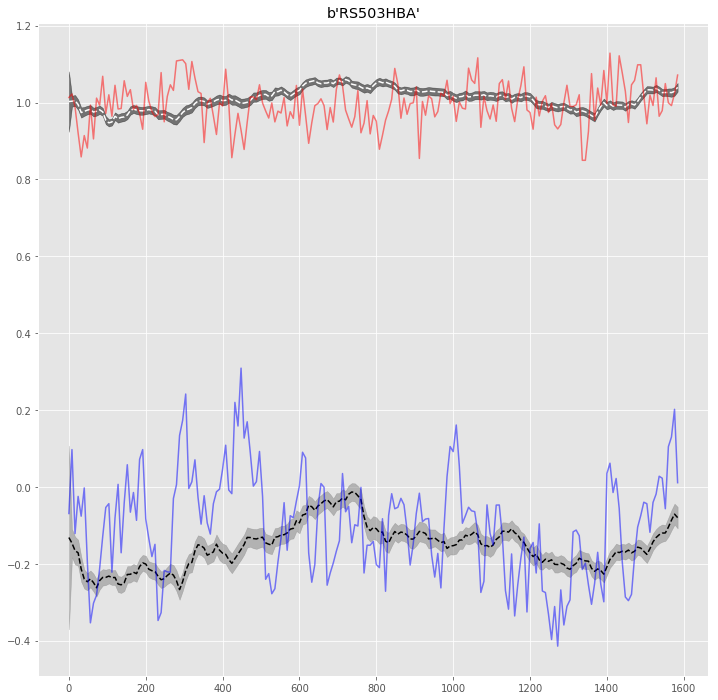

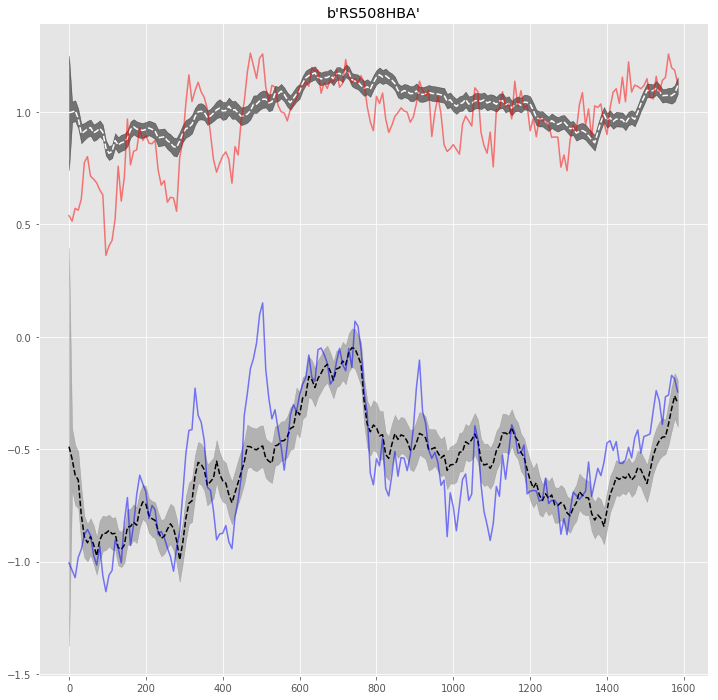

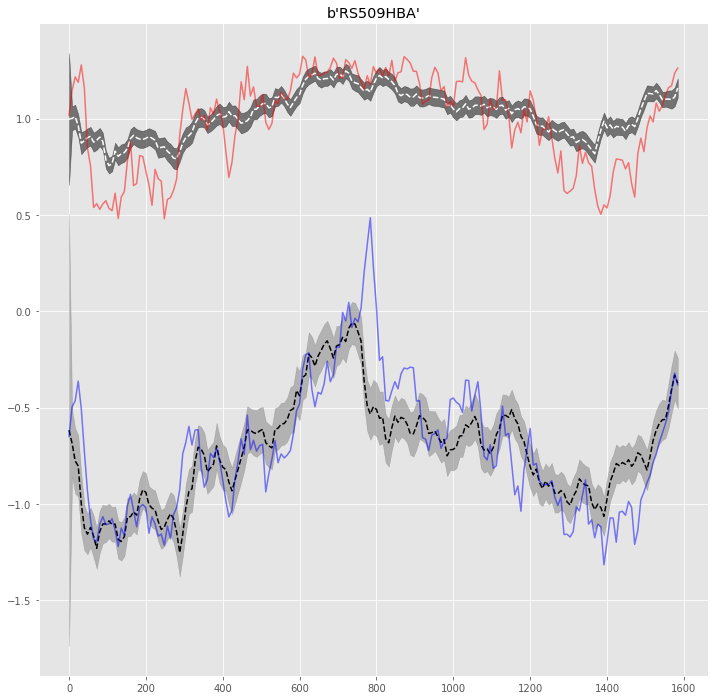

In [23]:
for i in range(3):
    plt.figure(figsize=(12,12))
    plt.plot(_X[:,39,i,0], gr_mu[:,39,i,0].T,c='white',ls='--')
    plt.fill_between(_X[:,39,i,0], gr_mu[:,39,i,0] - gr_std[:,39,i,0],
                     gr_mu[:,39,i,0] + gr_std[:,39,i,0],alpha=0.5,color='black')
    plt.plot(_X[:,39,i,0], gains.real[0,39,i,0,:],c='red',alpha=0.5)
    
    plt.plot(_X[:,39,i,0], gi_mu[:,39,i,0].T,c='black',ls='--')
    plt.fill_between(_X[:,39,i,0], gi_mu[:,39,i,0] - gi_std[:,39,i,0],
                     gi_mu[:,39,i,0] + gi_std[:,39,i,0],alpha=0.5,color='grey')
    plt.plot(_X[:,39,i,0], gains.imag[0,39,i,0,:],c='blue',alpha=0.5)
    
    plt.title(antenna_labels[i])
    plt.show()

In [12]:
gr_mu

array([[[[0.95570481],
         [0.99597328],
         [0.96682252]],

        [[1.03033485],
         [0.79959384],
         [0.78407681]],

        [[1.00451257],
         [0.93850443],
         [0.93039072]],

        ...,

        [[0.91578248],
         [0.90454459],
         [0.90722714]],

        [[1.01694255],
         [0.9656799 ],
         [0.92275798]],

        [[1.06273318],
         [0.96837336],
         [0.95005659]]],


       [[[0.97124917],
         [1.04523148],
         [0.9881558 ]],

        [[1.02932218],
         [0.79704803],
         [0.78035629]],

        [[1.00009596],
         [0.91910375],
         [0.90674308]],

        ...,

        [[0.93438198],
         [0.92516121],
         [0.92633286]],

        [[1.01399861],
         [0.95832185],
         [0.9081297 ]],

        [[1.05884496],
         [0.96050841],
         [0.93730332]]],


       [[[0.98592554],
         [1.09173913],
         [1.00829785]],

        [[1.03240656],
         [0.80480207],